<a href="https://colab.research.google.com/github/jfelipeo/Proyecto_Analitica_II_M3_Equipo5/blob/main/Evaluacion_y_Analisis_del_modelo_seleccionado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Evaluación y Análisis del modelo seleccionado

## Importe de librerías

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score
!pip install kneed
from kneed import KneeLocator

from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA, FactorAnalysis

!pip install factor_analyzer
from factor_analyzer import FactorAnalyzer

!pip install plotly
import plotly.express as px

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor_analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42564 sha256=ec9207723c80265df180036c1fa1087e24d20021567108eb113aa723c91dfa90
  Stored in directory: /root/.cache/pip/wheels/24/59/82/6493618e30ed1cb7a013b9e1b0c9e17de80b04dfcef4ba8a4d
Successfully built factor_analyzer


In [3]:
import warnings
warnings.filterwarnings('ignore')

## Lectura del dataset

In [4]:
df1_out = pd.read_csv('https://raw.githubusercontent.com/jfelipeo/Proyecto_Analitica_II_M3_Equipo5/main/data_sin_outliers.csv', sep=",")
df1_out.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Absenteeism time in hours
0,26,7,3,1,0.981812,0.456072,0.115466,-0.530399,-0.825141,0.645025,0,1,2,1,0,1,0.855365,-0.032906,-0.231133
1,0,7,3,1,-1.561100,-1.108954,1.260392,2.061557,-0.825141,0.645025,1,1,1,1,0,0,1.477769,0.941840,-0.525284
2,23,7,4,1,-0.653979,1.476741,1.260392,0.231941,-0.825141,0.645025,0,1,0,1,0,0,0.777564,-0.357821,-0.378208
3,7,7,5,1,0.833103,-1.653311,0.344451,0.384409,-0.825141,0.645025,0,1,2,1,1,0,-0.856246,-0.682736,-0.231133
4,23,7,5,1,0.981812,0.456072,0.115466,-0.530399,-0.825141,0.645025,0,1,2,1,0,1,0.855365,-0.032906,-0.378208


In [5]:
df_original = pd.read_csv('https://raw.githubusercontent.com/jfelipeo/Proyecto_Analitica_II_M3_Equipo5/main/data_original.csv', sep=",")
df_original.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Absenteeism time in hours
0,26,7,3,1,289.0,36.0,13.0,33.0,239.554,97.0,0,1,2,1,0,1,90.0,172.0,4.0
1,0,7,3,1,118.0,13.0,18.0,50.0,239.554,97.0,1,1,1,1,0,0,98.0,178.0,0.0
2,23,7,4,1,179.0,51.0,18.0,38.0,239.554,97.0,0,1,0,1,0,0,89.0,170.0,2.0
3,7,7,5,1,279.0,5.0,14.0,39.0,239.554,97.0,0,1,2,1,1,0,68.0,168.0,4.0
4,23,7,5,1,289.0,36.0,13.0,33.0,239.554,97.0,0,1,2,1,0,1,90.0,172.0,2.0


## Reducción de la dimensionalidad

In [6]:
#Cree un dataset reducido solo a 3 componentes
pca = PCA(n_components=3).fit(df1_out)

#Por último, transforme "train_df1"
X_pca = pca.fit_transform(df1_out)
X_pca[:3]

array([[-7.05888785, -0.61068708,  0.49316118],
       [18.92617412,  0.38940606, -3.26434329],
       [-4.13344576, -0.42103937, -1.4285178 ]])

## Creación de dataset final e importancia de las variables segun componente principal

In [7]:
df_final = df1_out.copy()
df_final['PCA1'] = X_pca[:,0]
df_final['PCA2'] = X_pca[:,1]
df_final['PCA3'] = X_pca[:,2]
df_final.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,...,Son,Social drinker,Social smoker,Pet,Weight,Height,Absenteeism time in hours,PCA1,PCA2,PCA3
0,26,7,3,1,0.981812,0.456072,0.115466,-0.530399,-0.825141,0.645025,...,2,1,0,1,0.855365,-0.032906,-0.231133,-7.058888,-0.610687,0.493161
1,0,7,3,1,-1.561100,-1.108954,1.260392,2.061557,-0.825141,0.645025,...,1,1,0,0,1.477769,0.941840,-0.525284,18.926174,0.389406,-3.264343
2,23,7,4,1,-0.653979,1.476741,1.260392,0.231941,-0.825141,0.645025,...,0,1,0,0,0.777564,-0.357821,-0.378208,-4.133446,-0.421039,-1.428518
3,7,7,5,1,0.833103,-1.653311,0.344451,0.384409,-0.825141,0.645025,...,2,1,1,0,-0.856246,-0.682736,-0.231133,11.911409,0.018784,-0.074383
4,23,7,5,1,0.981812,0.456072,0.115466,-0.530399,-0.825141,0.645025,...,2,1,0,1,0.855365,-0.032906,-0.378208,-4.099772,-0.531845,0.743217


In [8]:
# --- Pesos de las variables que componen las componentes principales ---
pesos_pca = pd.DataFrame(pca.components_, columns = df1_out.columns,
             index = ['PC 1', 'PC 2', 'PC 3']).round(2).T

pesos_pca

,PC 1,PC 2,PC 3
Reason for absence,-1.00,-0.03,0.00
Month of absence,0.03,-0.98,-0.03
Day of the week,-0.02,-0.01,0.12
Seasons,0.02,-0.14,-0.01
Transportation expense,0.01,-0.04,0.38
Distance from Residence to Work,-0.02,-0.01,0.19
Service time,-0.00,0.01,-0.43
Age,0.01,-0.00,-0.35
Work load Average/day,0.01,0.06,0.01
Hit target,-0.01,0.14,0.03


### Analísis por cada componente

In [9]:
pesos_pca['PC 1'].sort_values(ascending=False)

Month of absence                   0.03
Seasons                            0.02
Disciplinary failure               0.02
Absenteeism time in hours          0.01
Pet                                0.01
Height                             0.01
Transportation expense             0.01
Age                                0.01
Work load Average/day              0.01
Weight                             0.00
Service time                      -0.00
Education                          0.00
Son                                0.00
Social drinker                    -0.00
Social smoker                      0.00
Hit target                        -0.01
Distance from Residence to Work   -0.02
Day of the week                   -0.02
Reason for absence                -1.00
Name: PC 1, dtype: float64

* Pesos positivos: Indican una asociación positiva entre la variable y la componente principal. Esto significa que a medida que el valor de la variable aumenta, también lo hace la contribución de esa variable a la componente principal. Por ejemplo, variables como "Month of absence" (Mes de ausencia) y "Absenteeism time in hours" (Tiempo de ausencia en horas) tienen pesos positivos. Esto sugiere que los meses de ausencia y el tiempo de ausencia en horas tienden a aumentar juntos con esta componente principal.


* Pesos negativos: Indican una asociación negativa entre la variable y la componente principal. Esto significa que a medida que el valor de la variable aumenta, la contribución de esa variable a la componente principal disminuye. Por ejemplo, variables como "Hit target" (Objetivo alcanzado) y "Day of the week" (Día de la semana) tienen pesos negativos. Esto sugiere que un mayor cumplimiento del objetivo y ciertos días de la semana están asociados con una menor contribución a esta componente principal.

In [10]:
print (pesos_pca['PC 2'].sort_values(ascending=False))

Hit target                         0.14
Work load Average/day              0.06
Height                             0.03
Education                          0.02
Service time                       0.01
Social smoker                      0.00
Disciplinary failure              -0.00
Absenteeism time in hours         -0.00
Age                               -0.00
Distance from Residence to Work   -0.01
Social drinker                    -0.01
Pet                               -0.01
Weight                            -0.01
Day of the week                   -0.01
Son                               -0.02
Reason for absence                -0.03
Transportation expense            -0.04
Seasons                           -0.14
Month of absence                  -0.98
Name: PC 2, dtype: float64


* Hit target (Objetivo alcanzado): Tiene el peso más alto y positivo en esta componente. Esto sugiere que un mayor cumplimiento del objetivo está asociado positivamente con la segunda componente principal.
* Work load Average/day (Carga de trabajo promedio por día): También tiene un peso positivo significativo. Indica que una carga de trabajo diaria más alta está asociada positivamente con esta componente.
* Height (Altura), Education (Educación), Service time (Tiempo de servicio): Tienen pesos positivos, aunque menores. Esto sugiere que la altura, el nivel de educación y el tiempo de servicio tienen una asociación positiva, pero más débil, con la segunda componente principal

* Seasons (Estaciones), Month of absence (Mes de ausencia): Tienen los pesos más negativos en esta componente. Esto indica que ciertas estaciones del año y meses específicos de ausencia tienen una asociación negativa fuerte con la segunda componente principal.

In [11]:
print (pesos_pca['PC 3'].sort_values(ascending=False))

Pet                                0.59
Transportation expense             0.38
Distance from Residence to Work    0.19
Son                                0.18
Day of the week                    0.12
Hit target                         0.03
Education                          0.03
Social smoker                      0.01
Work load Average/day              0.01
Disciplinary failure              -0.00
Reason for absence                 0.00
Seasons                           -0.01
Absenteeism time in hours         -0.02
Month of absence                  -0.03
Social drinker                    -0.05
Height                            -0.15
Weight                            -0.32
Age                               -0.35
Service time                      -0.43
Name: PC 3, dtype: float64


* Pet (Mascota): Tiene el peso más alto y positivo en esta componente. Esto sugiere que la presencia de mascotas está asociada positivamente con la tercera componente principal.
* Transportation expense (Gasto en transporte), Distance from Residence to Work (Distancia desde la residencia hasta el trabajo), Son (Hijos), Day of the week (Día de la semana): Todos tienen pesos positivos, lo que sugiere una asociación positiva con la tercera componente principal. Parece que factores como el gasto en transporte, la distancia al trabajo, la cantidad de hijos y el día de la semana tienen una influencia positiva en esta componente.

* Height (Altura), Weight (Peso), Age (Edad), Service time (Tiempo de servicio): Tienen pesos negativos y significativos. Esto indica que variables como la altura, el peso, la edad y el tiempo de servicio están inversamente asociadas con la tercera componente principal

# Modelo K-means

## Seleccion del número optimo de K

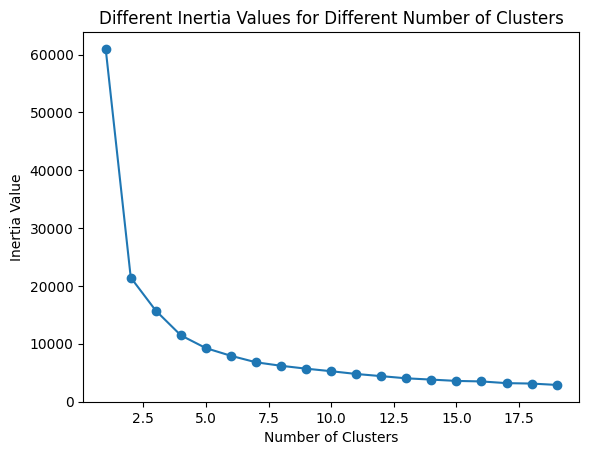

In [12]:
# Número optimo de K
inertia_list = []

for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_pca)
    inertia_list.append(kmeans.inertia_)

# plot the inertia curve
plt.plot(range(1,20),inertia_list)
plt.scatter(range(1,20),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [13]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans = KMeans(n_clusters = 5, **kmeans_constants)
model_kmeans.fit(X_pca)

KMeans(max_iter=500, n_clusters=5, n_init=100, random_state=42)

## Evaluación de modelo

In [14]:
from tabulate import tabulate

# Evaluación de ambos modelos K-Means
headers = ["Modelo", "Inertia", "Silhouette Score", "Calinski-Harabasz Score"]
data = [
    ["Primer modelo K-Means Reducido", model_kmeans.inertia_, silhouette_score(X_pca, model_kmeans.labels_), calinski_harabasz_score(X_pca, model_kmeans.labels_)]
]

print(tabulate(data, headers=headers, tablefmt="grid"))

+--------------------------------+-----------+--------------------+---------------------------+
| Modelo                         |   Inertia |   Silhouette Score |   Calinski-Harabasz Score |
+================================+===========+====================+===========================+
| Primer modelo K-Means Reducido |   9232.62 |           0.386509 |                   973.676 |
+--------------------------------+-----------+--------------------+---------------------------+


In [15]:
# Predicción de los clusters
Cluster_1 = model_kmeans.fit_predict(X_pca)

df_final['Cluster_1']= Cluster_1

# A partir de ahora, sólo trabajaremos con "df_final"
df_final.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,...,Social drinker,Social smoker,Pet,Weight,Height,Absenteeism time in hours,PCA1,PCA2,PCA3,Cluster_1
0,26,7,3,1,0.981812,0.456072,0.115466,-0.530399,-0.825141,0.645025,...,1,0,1,0.855365,-0.032906,-0.231133,-7.058888,-0.610687,0.493161,4
1,0,7,3,1,-1.561100,-1.108954,1.260392,2.061557,-0.825141,0.645025,...,1,0,0,1.477769,0.941840,-0.525284,18.926174,0.389406,-3.264343,2
2,23,7,4,1,-0.653979,1.476741,1.260392,0.231941,-0.825141,0.645025,...,1,0,0,0.777564,-0.357821,-0.378208,-4.133446,-0.421039,-1.428518,3
3,7,7,5,1,0.833103,-1.653311,0.344451,0.384409,-0.825141,0.645025,...,1,1,0,-0.856246,-0.682736,-0.231133,11.911409,0.018784,-0.074383,0
4,23,7,5,1,0.981812,0.456072,0.115466,-0.530399,-0.825141,0.645025,...,1,0,1,0.855365,-0.032906,-0.378208,-4.099772,-0.531845,0.743217,3


## Análisis Gráfico

In [16]:
# 3d scatterplot using plotly.express
df_final['Cluster_1'] = df_final['Cluster_1'].astype('category')
fig = px.scatter_3d(df_final, x="PCA1", y="PCA2", z="PCA3", color="Cluster_1")
fig.update_layout(width=1000, height=700)
fig.show()

In [17]:
fig = px.scatter(df_final, x="PCA1", y="PCA2", color="Cluster_1")
fig.update_layout(width=700, height=400)
fig.show(config={'displayModeBar': False})

# Interpretación

In [18]:
# Conversión de variables numéricas a valores originales
scaled_df1 = df_original[['Transportation expense','Distance from Residence to Work','Service time','Age','Work load Average/day ','Hit target','Weight','Height','Absenteeism time in hours']]


# Union de data numéricas y categórica
cols = ['Transportation expense','Distance from Residence to Work','Service time','Age','Work load Average/day ','Hit target','Weight','Height','Absenteeism time in hours']
df_final[cols] = scaled_df1
df_final.head()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,...,Social drinker,Social smoker,Pet,Weight,Height,Absenteeism time in hours,PCA1,PCA2,PCA3,Cluster_1
0,26,7,3,1,289.0,36.0,13.0,33.0,239.554,97.0,...,1,0,1,90.0,172.0,4.0,-7.058888,-0.610687,0.493161,4
1,0,7,3,1,118.0,13.0,18.0,50.0,239.554,97.0,...,1,0,0,98.0,178.0,0.0,18.926174,0.389406,-3.264343,2
2,23,7,4,1,179.0,51.0,18.0,38.0,239.554,97.0,...,1,0,0,89.0,170.0,2.0,-4.133446,-0.421039,-1.428518,3
3,7,7,5,1,279.0,5.0,14.0,39.0,239.554,97.0,...,1,1,0,68.0,168.0,4.0,11.911409,0.018784,-0.074383,0
4,23,7,5,1,289.0,36.0,13.0,33.0,239.554,97.0,...,1,0,1,90.0,172.0,2.0,-4.099772,-0.531845,0.743217,3


## Composición de los cluster formados

<Axes: xlabel='Cluster_1', ylabel='count'>

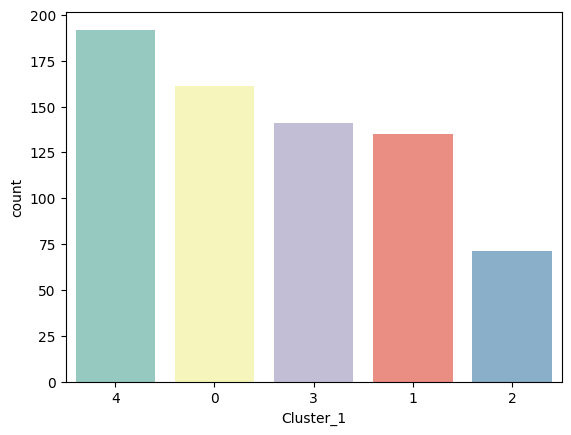

In [19]:
# Composición de los clusters formados
sns.countplot(x="Cluster_1",data=df_final, palette="Set3", order = df_final['Cluster_1'].value_counts().index)

In [20]:
# Composición de los clusters - Media de las variables por cluster
df_final.groupby(['Cluster_1']).mean()

,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,Hit target,...,Son,Social drinker,Social smoker,Pet,Weight,Height,Absenteeism time in hours,PCA1,PCA2,PCA3
Cluster_1,,,,,,,,,,,,,,,,,,,,,
0,11.472050,6.118012,3.745342,2.658385,221.770186,27.366460,12.639752,36.204969,283.059733,94.534161,...,0.944099,0.534161,0.093168,0.602484,77.776398,172.285714,10.484472,7.465107,0.539942,-0.138752
1,27.066667,3.370370,4.074074,2.266667,199.748148,31.859259,13.325926,36.325926,272.617289,96.740741,...,0.762963,0.555556,0.037037,0.355556,78.629630,171.918519,3.348148,-8.229962,2.858799,-0.325777
2,1.042254,7.394366,3.732394,2.943662,240.901408,26.169014,12.535211,39.126761,275.373521,93.436620,...,1.154930,0.563380,0.126761,0.788732,81.084507,173.000000,3.971831,17.936858,-0.481893,-0.191673
3,21.163121,4.489362,3.893617,2.078014,233.070922,29.127660,11.439716,35.553191,273.958865,95.914894,...,1.234043,0.553191,0.113475,1.368794,78.808511,173.276596,7.021277,-2.275546,1.916416,0.630291
4,24.489583,9.859375,3.973958,2.864583,226.776042,30.713542,12.494792,36.296875,260.818396,92.369792,...,1.187500,0.609375,0.046875,0.750000,79.635417,171.114583,4.911458,-5.434908,-3.692025,-0.046579


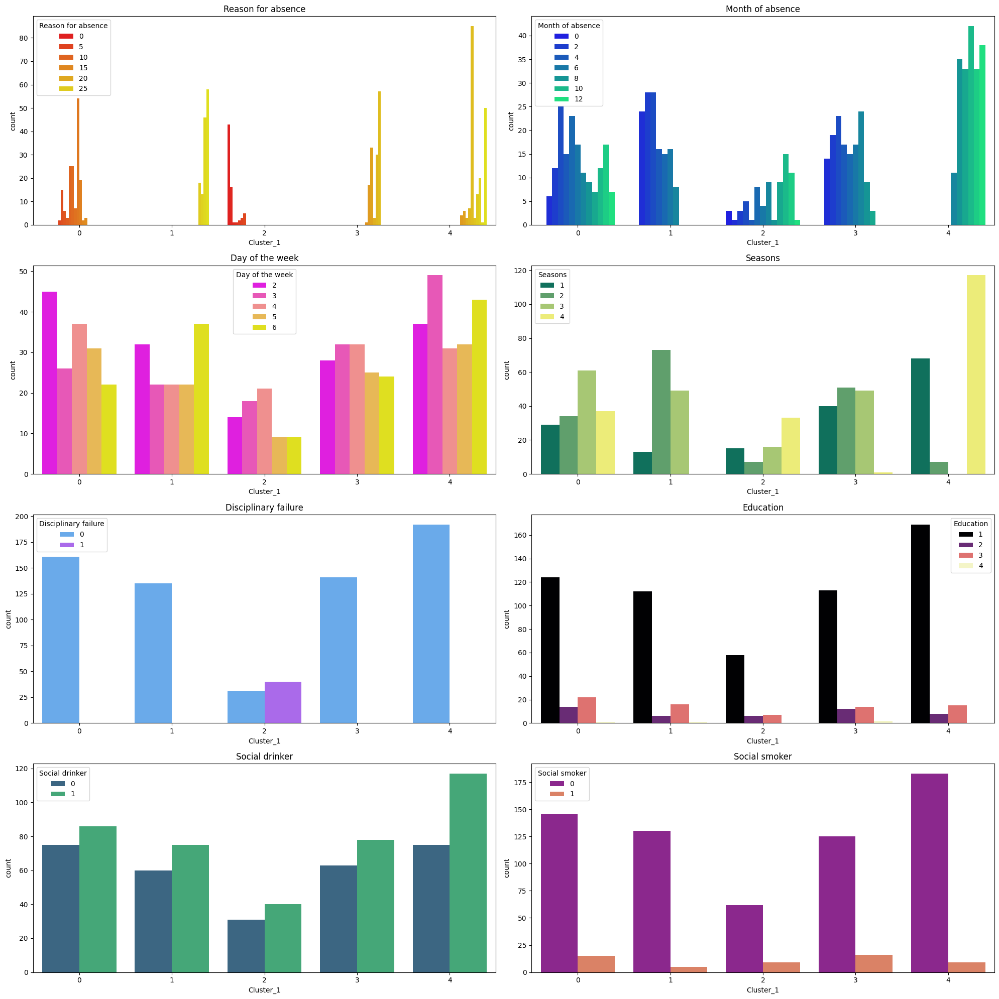

In [21]:
# Variables Categóricas
df_final['Cluster_1']= df_final['Cluster_1'].astype('int')
cols_cate = ['Reason for absence','Month of absence','Day of the week', 'Seasons','Disciplinary failure','Education','Social drinker','Social smoker']

pal = ['autumn', 'winter', 'spring', 'summer','cool','magma','viridis','plasma']

# Crear una figura con múltiples subplots en varias filas
num_rows = len(cols_cate) // 2 + len(cols_cate) % 2  # Calcula el número de filas necesario
fig, axs = plt.subplots(nrows=num_rows, ncols=2, figsize=(20, 5*num_rows))

# Iterar sobre las columnas categóricas y los subplots
for idx, i in enumerate(cols_cate):
    row = idx // 2  # Calcula el índice de fila actual
    col = idx % 2   # Calcula el índice de columna actual
    sns.countplot(data=df_final, x='Cluster_1', hue=i, palette=pal[idx], ax=axs[row, col])
    axs[row, col].set_title(i)  # Establece el título del subplot

# Ajustar el diseño
plt.tight_layout()
plt.show()

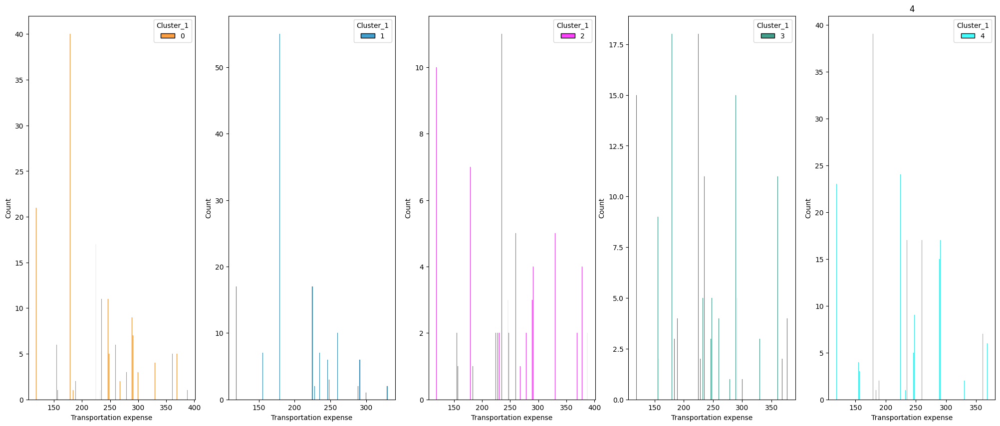

In [22]:
# Análisis del Gasto en transporte
trans_exp = df_final[['Cluster_1','Transportation expense']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=trans_exp[trans_exp.Cluster_1==i],x='Transportation expense',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

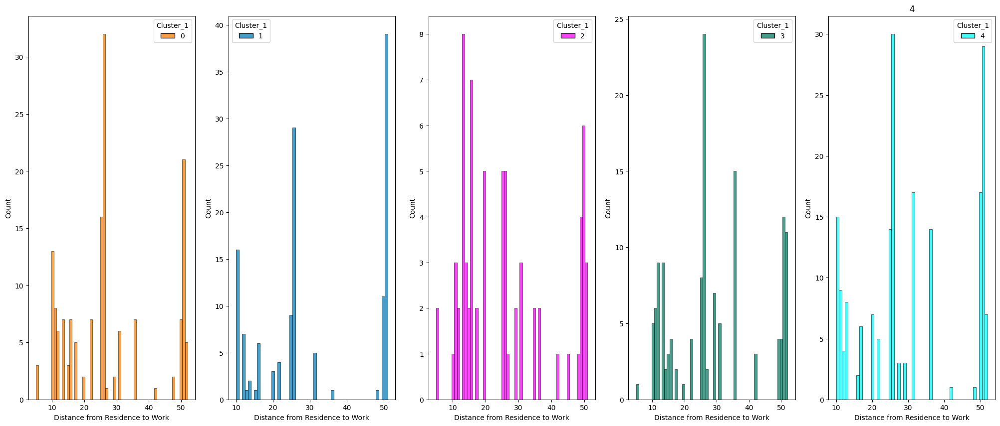

In [23]:
# Análisis de Distancia desde la residencia hasta el trabajo
dist_HW = df_final[['Cluster_1','Distance from Residence to Work']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=dist_HW[dist_HW.Cluster_1==i],x='Distance from Residence to Work',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

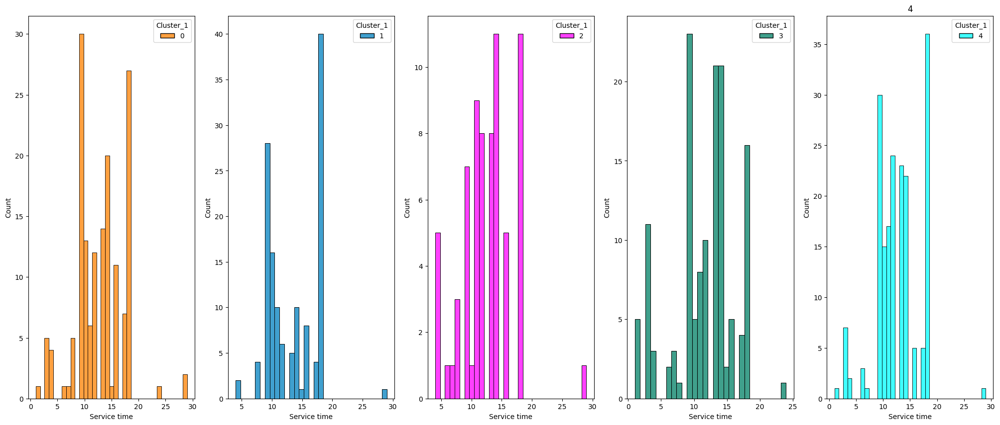

In [24]:
# Análisis del tiempo de servicio
serv_time = df_final[['Cluster_1','Service time']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=serv_time[serv_time.Cluster_1==i],x='Service time',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

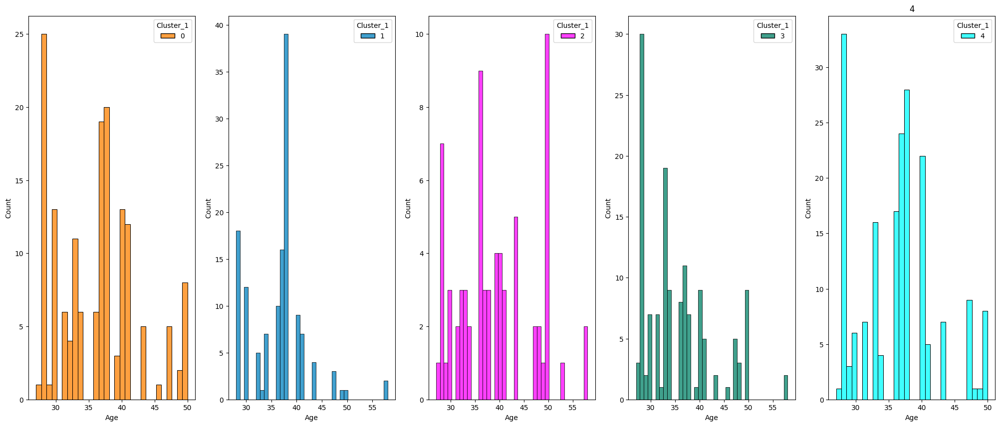

In [25]:
# Análisis de la edad
age = df_final[['Cluster_1','Age']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=age[age.Cluster_1==i],x='Age',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

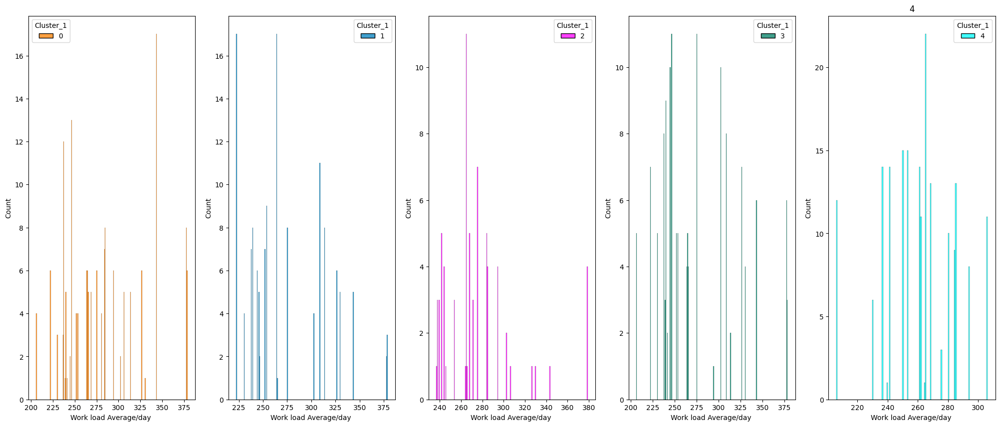

In [26]:
# Análisis de Carga de trabajo promedio por día
work_avg = df_final[['Cluster_1','Work load Average/day ']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=work_avg[work_avg.Cluster_1==i],x='Work load Average/day ',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

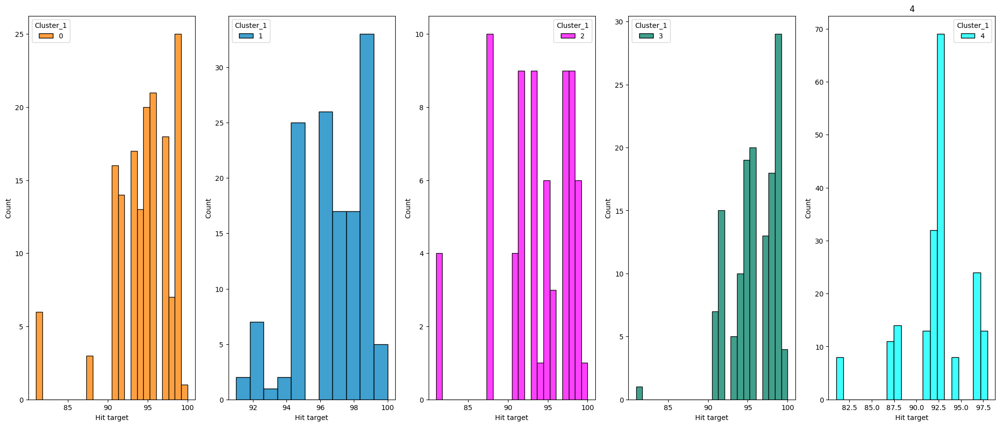

In [27]:
# Análisis del Objetivo alcanzado
hit_trg = df_final[['Cluster_1','Hit target']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=hit_trg[hit_trg.Cluster_1==i],x='Hit target',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

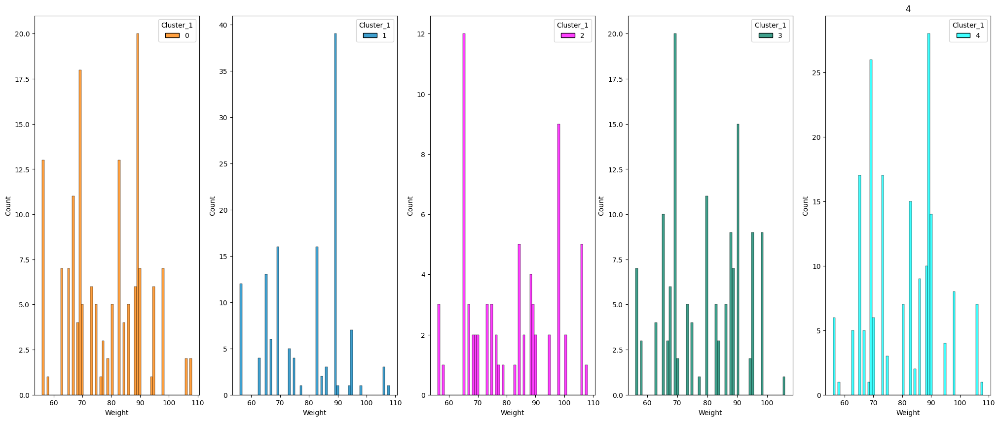

In [28]:
# Análisis del peso
weight = df_final[['Cluster_1','Weight']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=weight[weight.Cluster_1==i],x='Weight',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

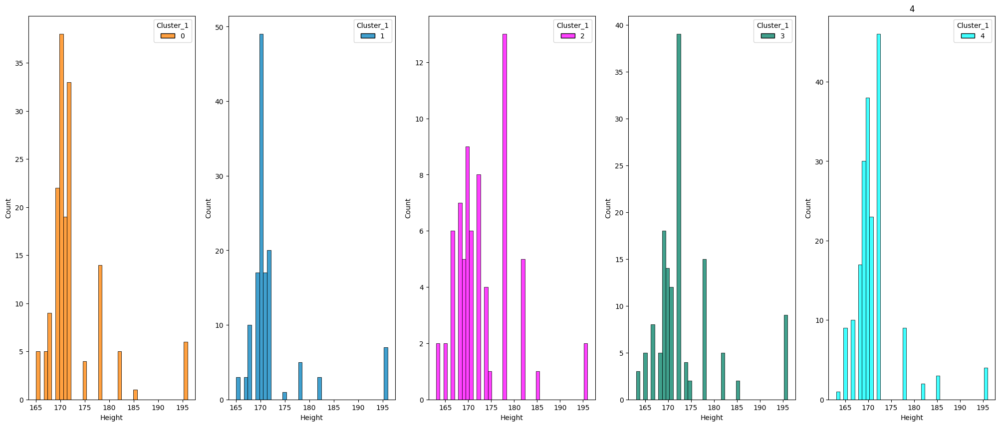

In [29]:
# Análisis de la altura
height = df_final[['Cluster_1','Height']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=height[height.Cluster_1==i],x='Height',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

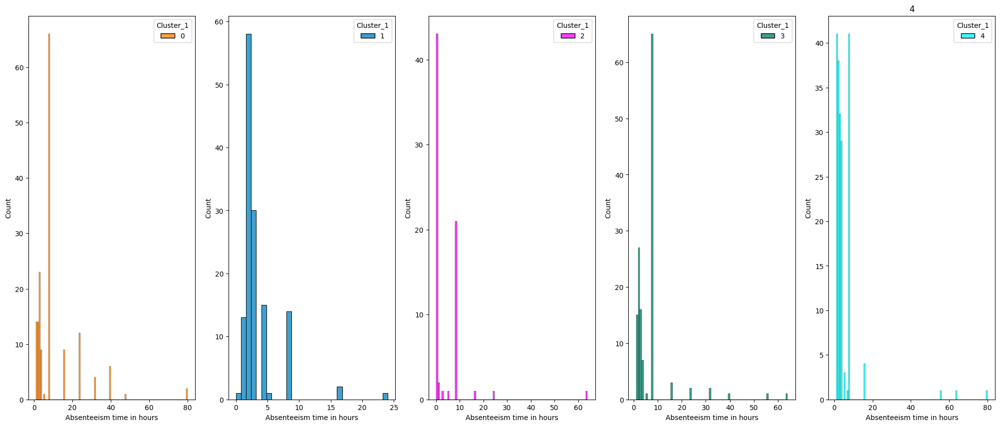

In [30]:
# Análisis del tiempo de ausentismo en horas
time = df_final[['Cluster_1','Absenteeism time in hours']]
fig,axs=plt.subplots(ncols=5,figsize =(25, 10))

for i in list(range(0,5)):
    plt.title(i)
    sns.histplot(data=time[time.Cluster_1==i],x='Absenteeism time in hours',hue='Cluster_1',palette=pal[i],binwidth=.8,ax=axs[i],multiple='dodge')

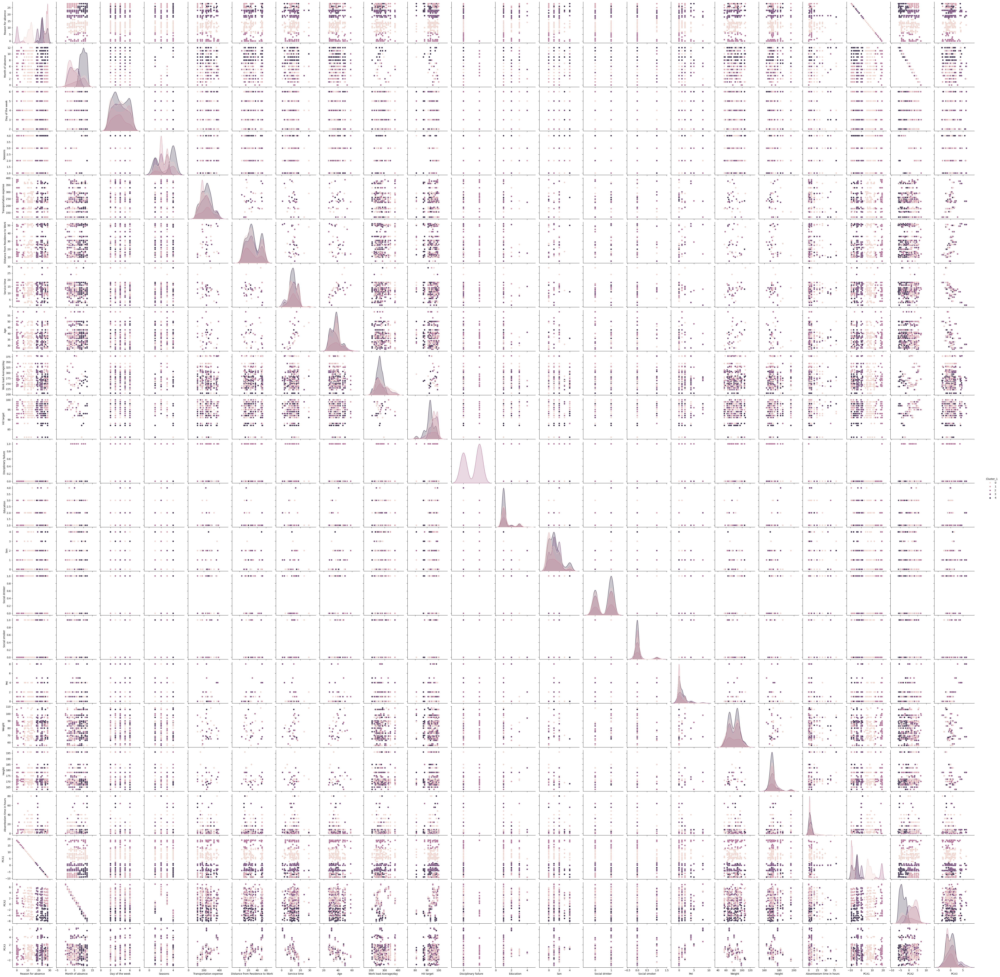

Cluster 0:
       Reason for absence  Month of absence  Day of the week     Seasons  \
count          161.000000        161.000000       161.000000  161.000000   
mean            11.472050          6.118012         3.745342    2.658385   
std              2.299625          3.188610         1.402139    1.025339   
min              6.000000          1.000000         2.000000    1.000000   
25%             10.000000          3.000000         2.000000    2.000000   
50%             12.000000          5.000000         4.000000    3.000000   
75%             13.000000          9.000000         5.000000    3.000000   
max             16.000000         12.000000         6.000000    4.000000   

       Transportation expense  Distance from Residence to Work  Service time  \
count              161.000000                       161.000000    161.000000   
mean               221.770186                        27.366460     12.639752   
std                 68.062586                        14.319431  

In [31]:

# Agrupación por Cluster
cluster_groups = df_final.groupby('Cluster_1')

# Estadísticas Descriptivas
cluster_stats = cluster_groups.describe()

# Visualización
sns.pairplot(df_final, hue='Cluster_1', diag_kind='kde')
plt.show()

# Comparación entre Clusters
for cluster, data in cluster_groups:
    print(f"Cluster {cluster}:")
    print(data.describe())

In [32]:
df_final = df_final.astype(int)

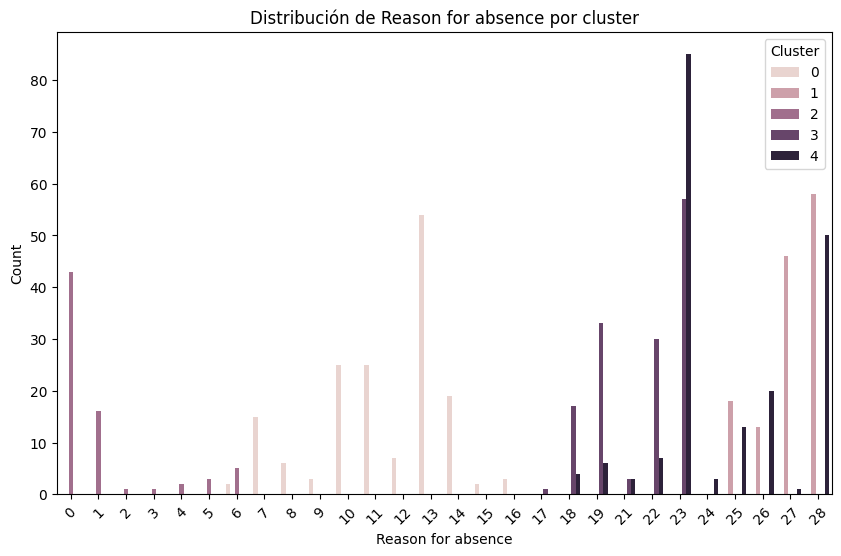

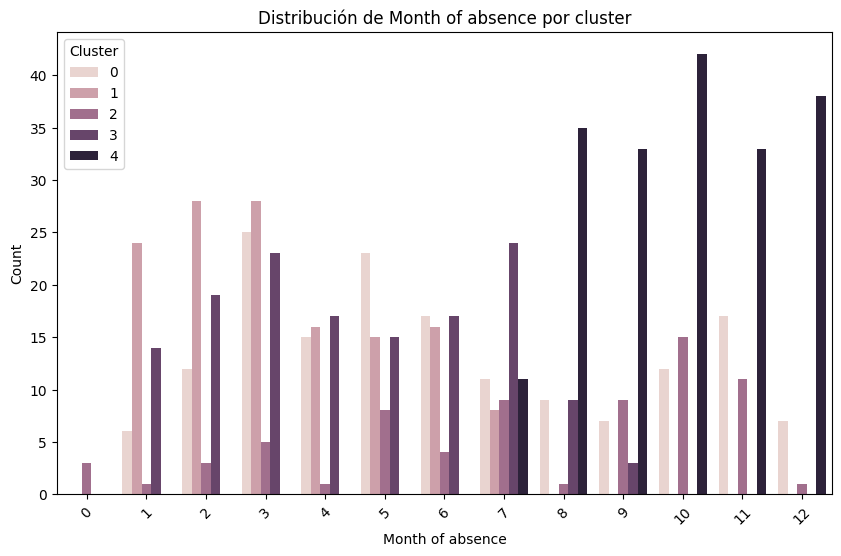

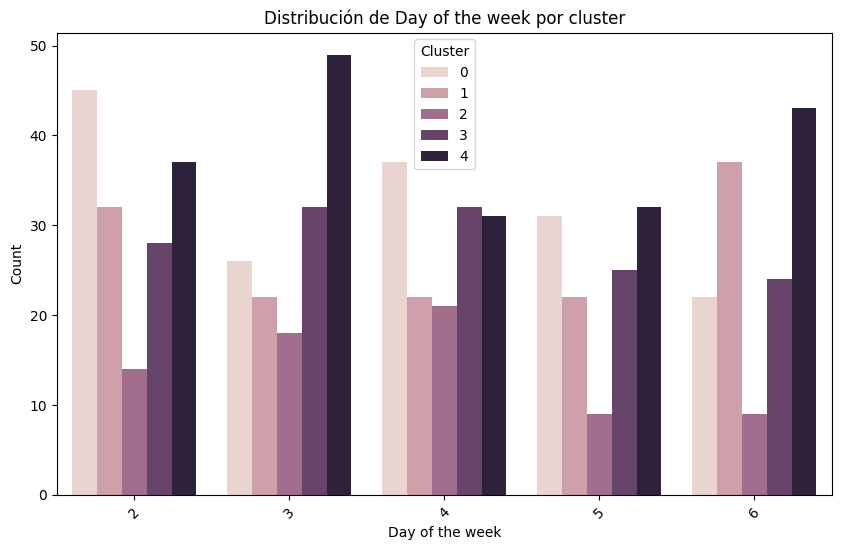

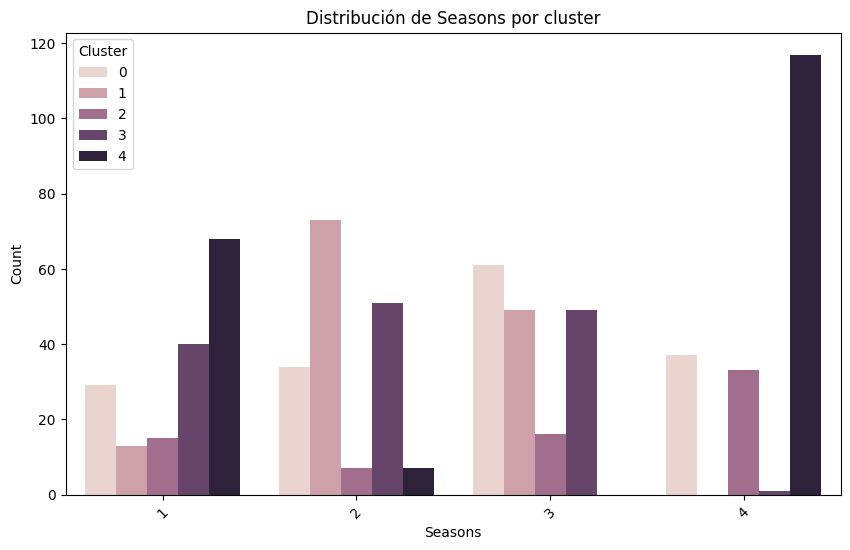

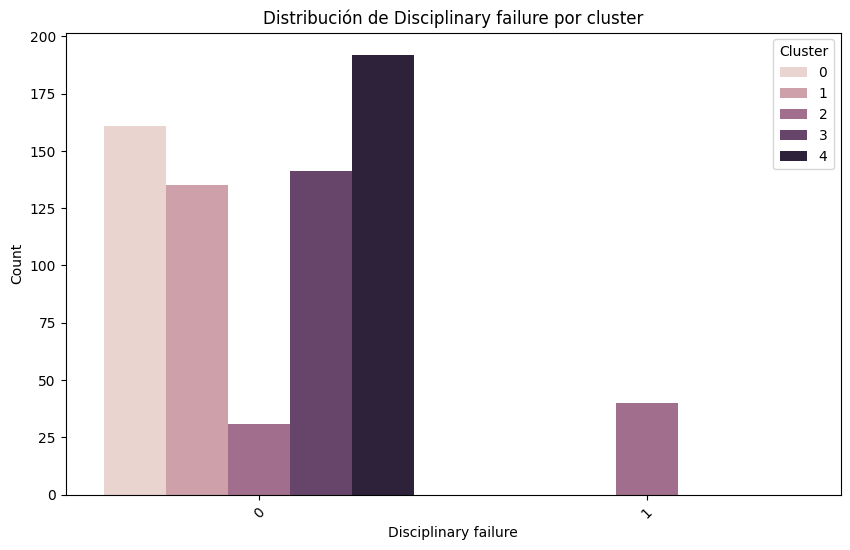

...

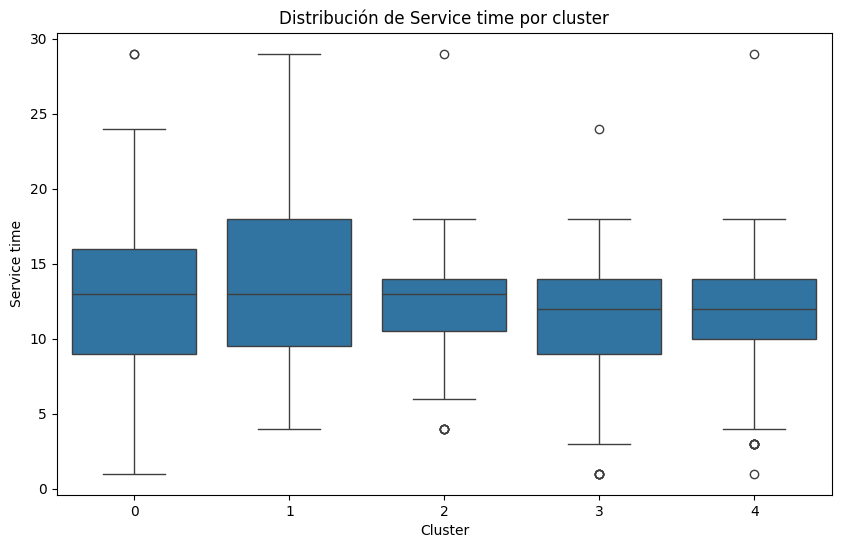

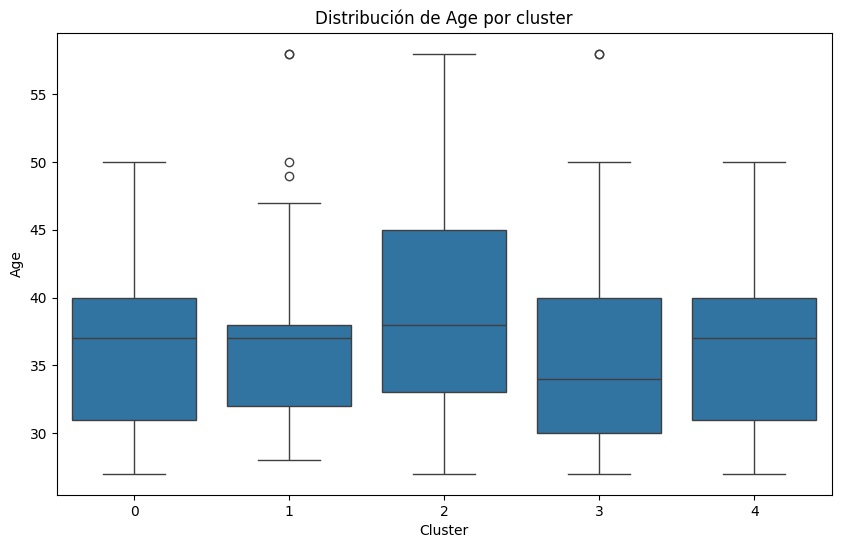

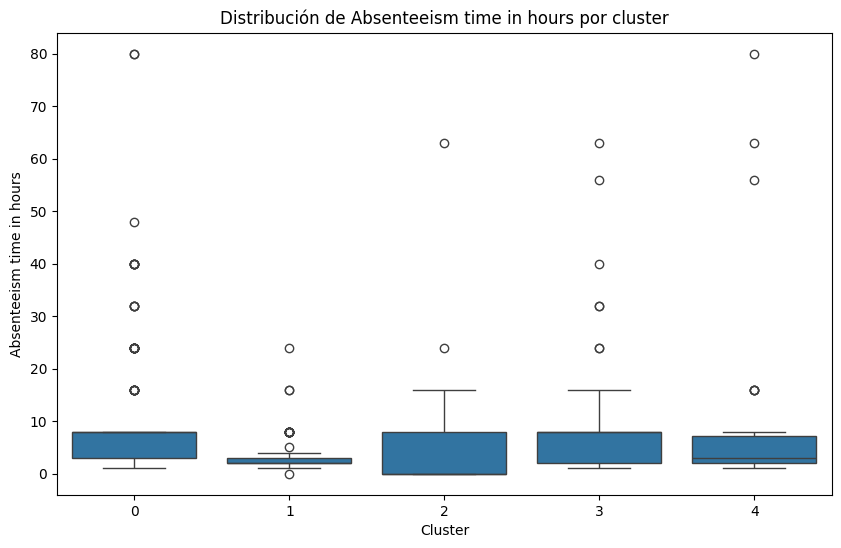

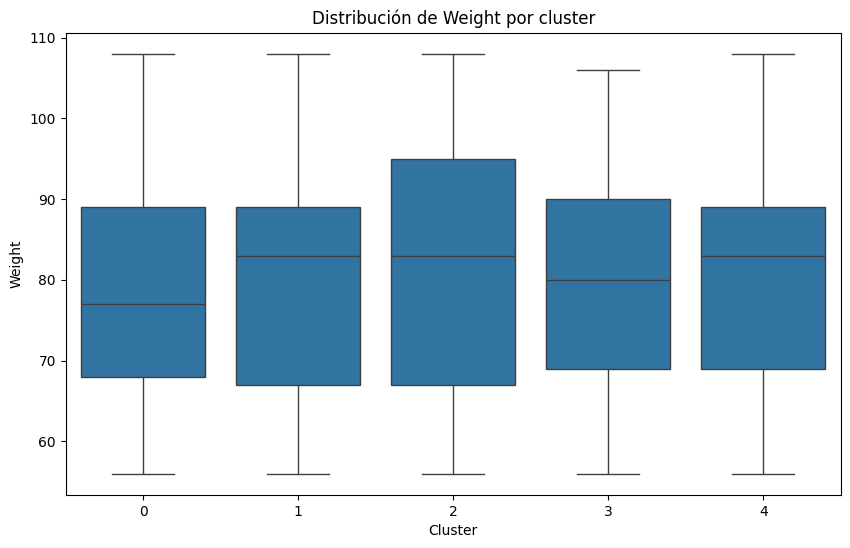

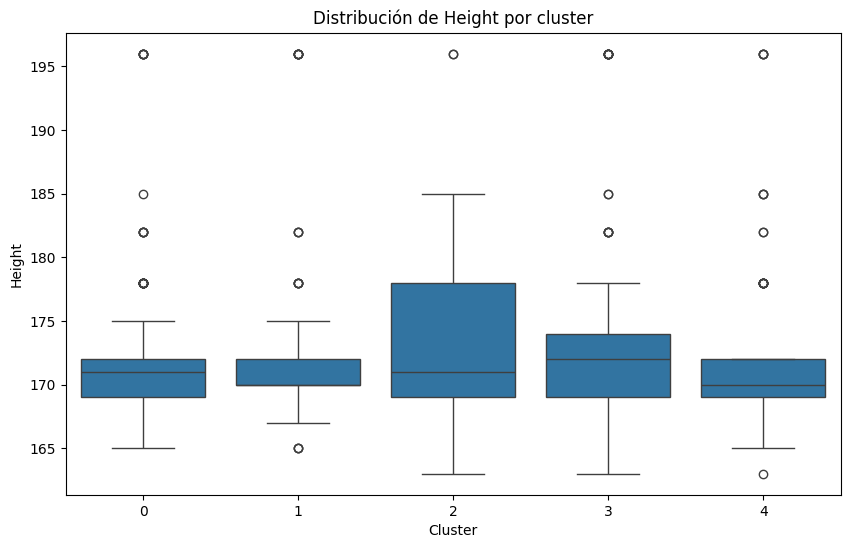

In [33]:
# Paso 1: Análisis de estadísticas descriptivas por cluster
cluster_stats = df_final.groupby('Cluster_1').describe()

# Paso 2: Visualización de características por cluster
categorical_columns = ['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
                       'Disciplinary failure', 'Education', 'Social drinker', 'Social smoker']
numeric_columns = ['Transportation expense', 'Distance from Residence to Work',
                   'Service time', 'Age', 'Absenteeism time in hours', 'Weight', 'Height']

for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df_final, x=col, hue='Cluster_1')
    plt.title(f'Distribución de {col} por cluster')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Cluster')
    plt.show()

for col in numeric_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df_final, x='Cluster_1', y=col)
    plt.title(f'Distribución de {col} por cluster')
    plt.xlabel('Cluster')
    plt.ylabel(col)
    plt.show()

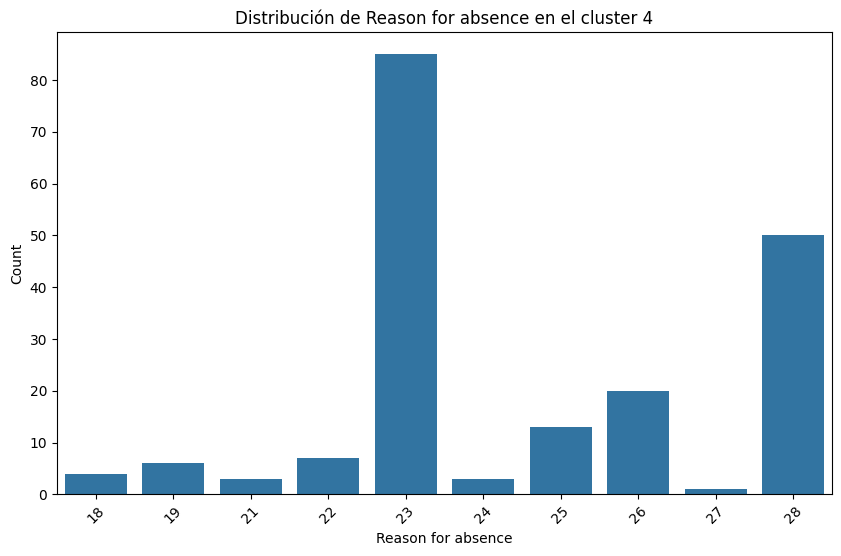

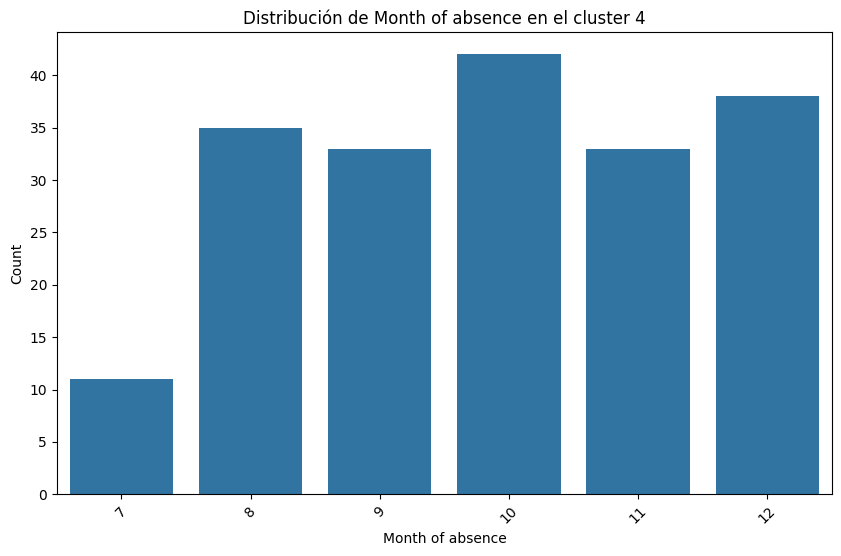

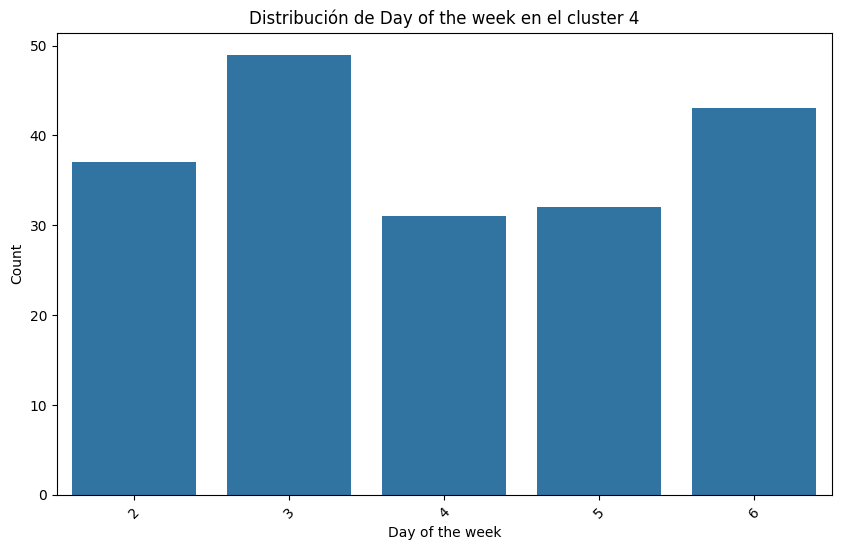

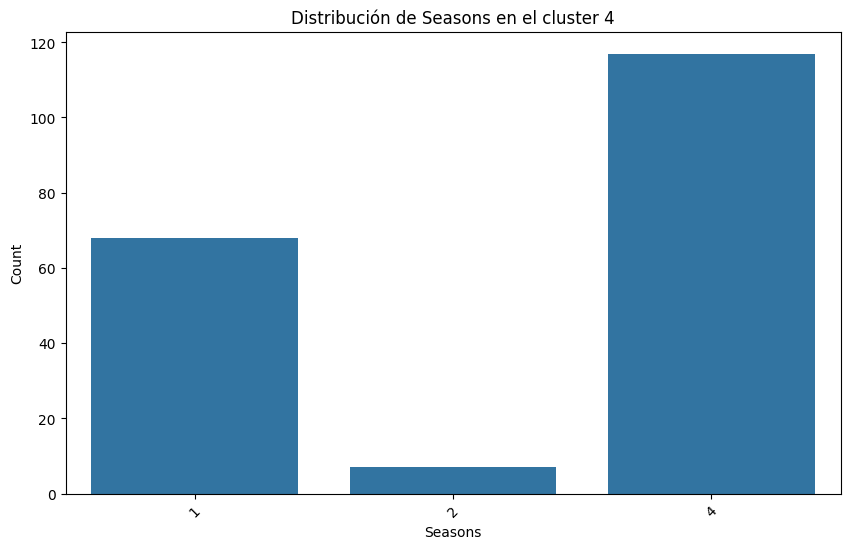

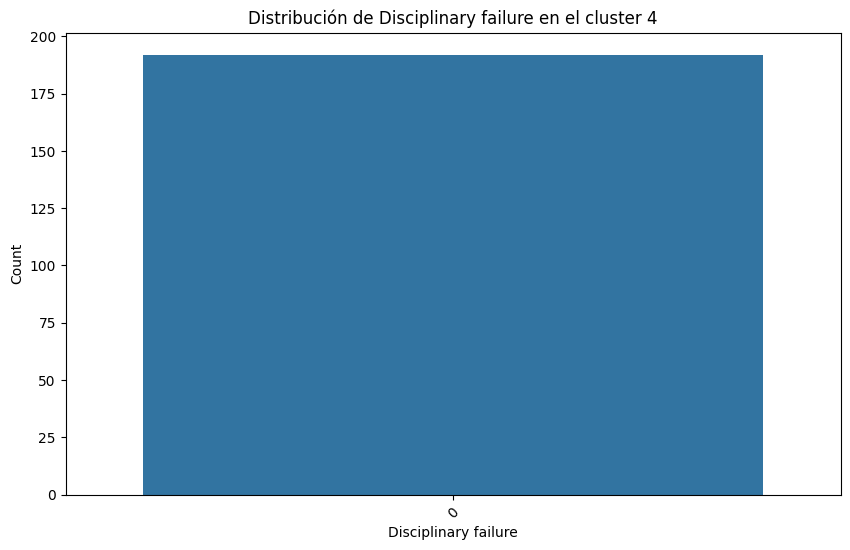

...

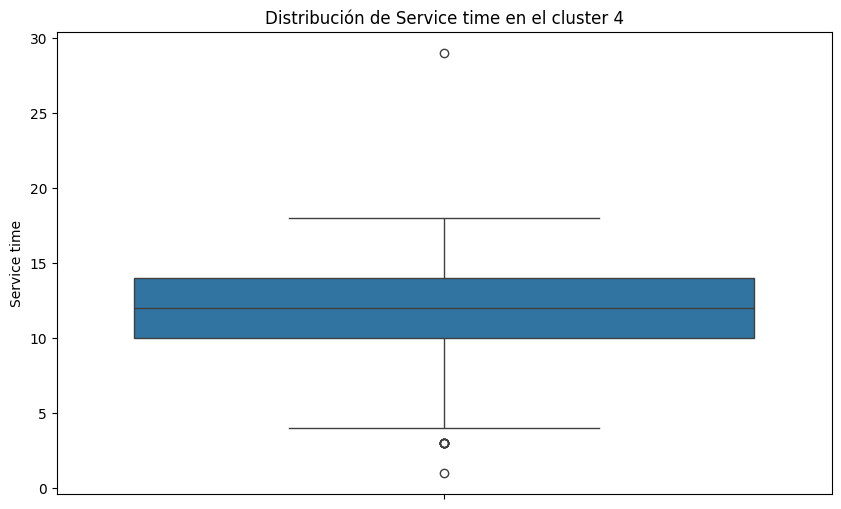

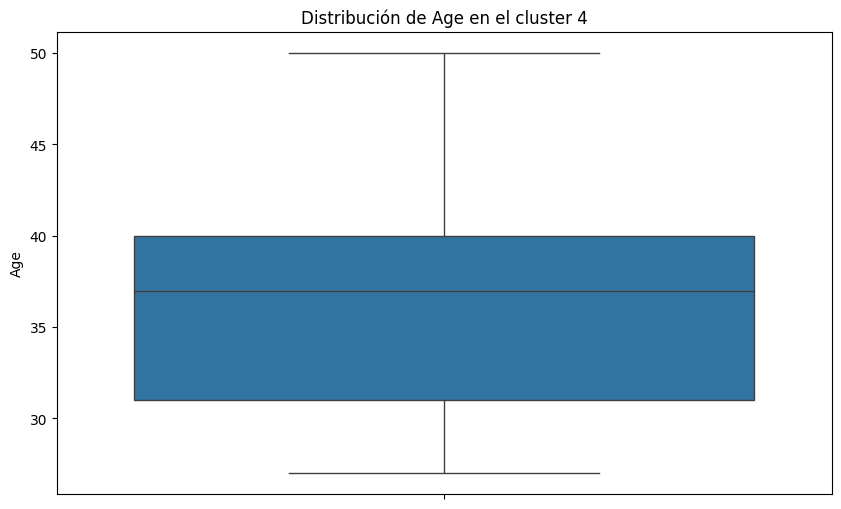

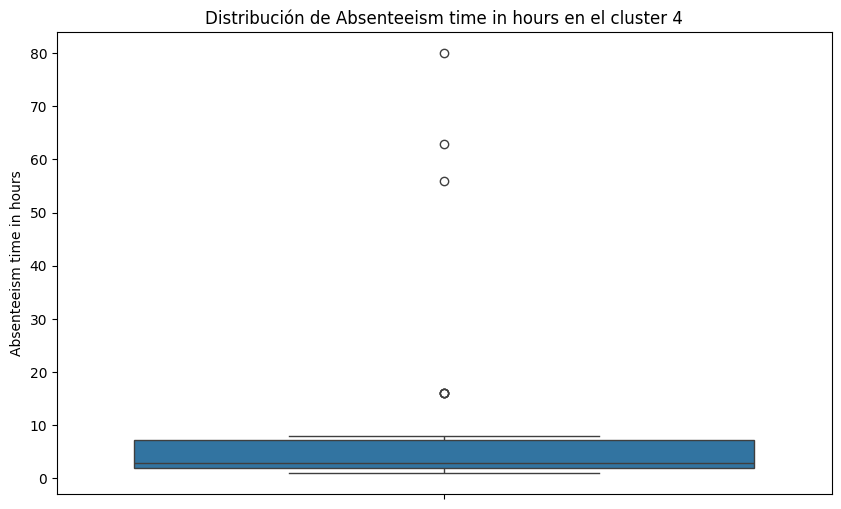

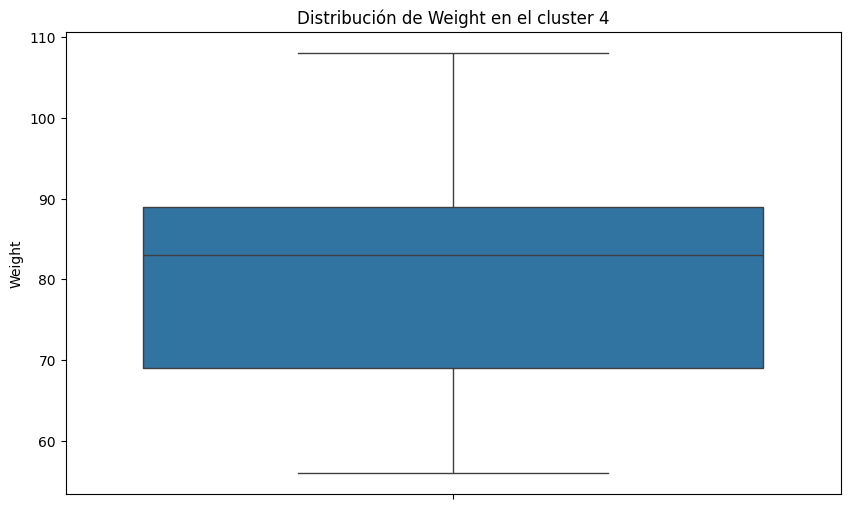

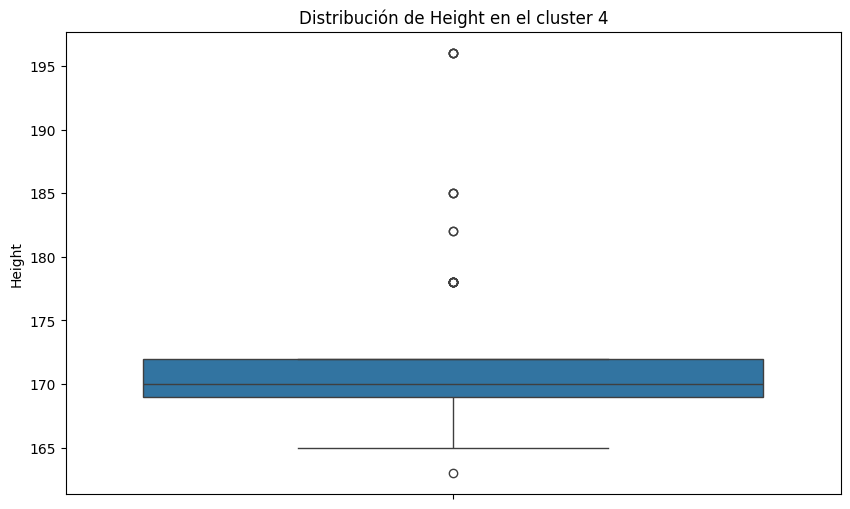

Estadísticas descriptivas para el cluster 4:
       Reason for absence  Month of absence  Day of the week     Seasons  \
count          192.000000        192.000000       192.000000  192.000000   
mean            24.489583          9.859375         3.973958    2.864583   
std              2.598811          1.540387         1.448722    1.433480   
min             18.000000          7.000000         2.000000    1.000000   
25%             23.000000          9.000000         3.000000    1.000000   
50%             23.000000         10.000000         4.000000    4.000000   
75%             28.000000         11.000000         5.000000    4.000000   
max             28.000000         12.000000         6.000000    4.000000   

       Transportation expense  Distance from Residence to Work  Service time  \
count              192.000000                       192.000000    192.000000   
mean               226.776042                        30.713542     12.494792   
std                 65.681102 

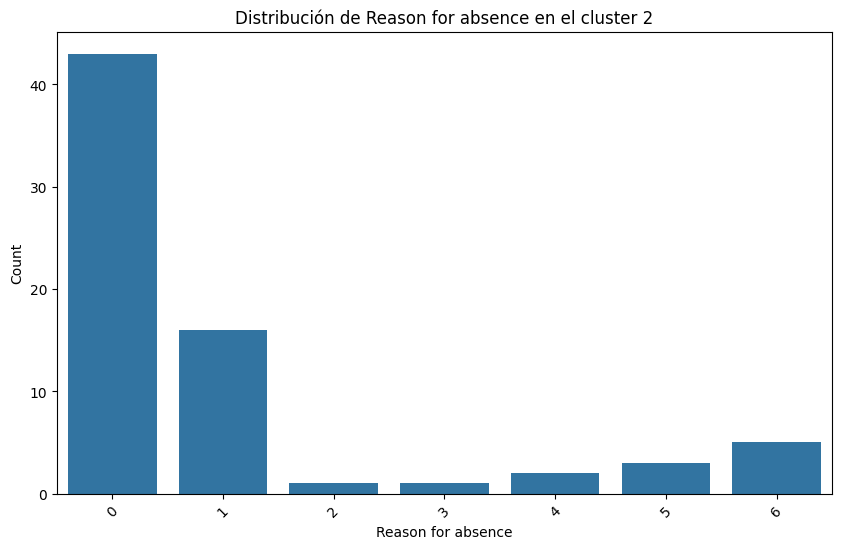

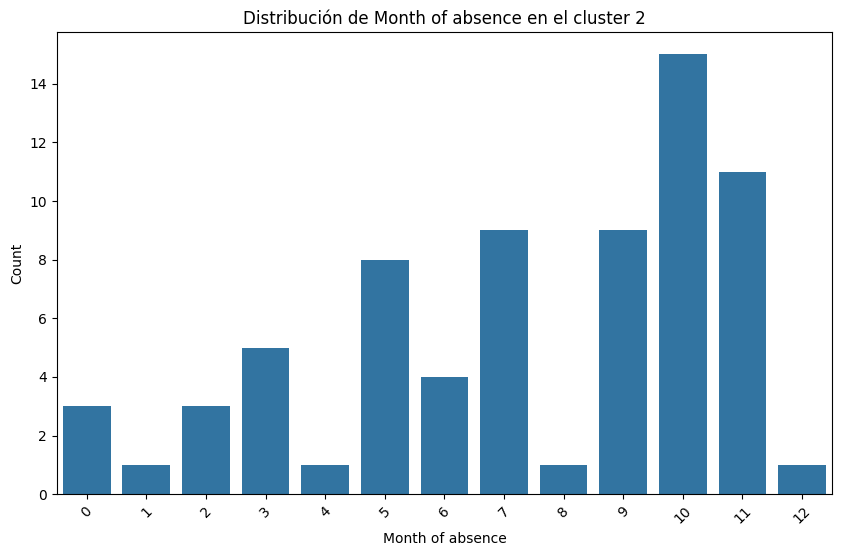

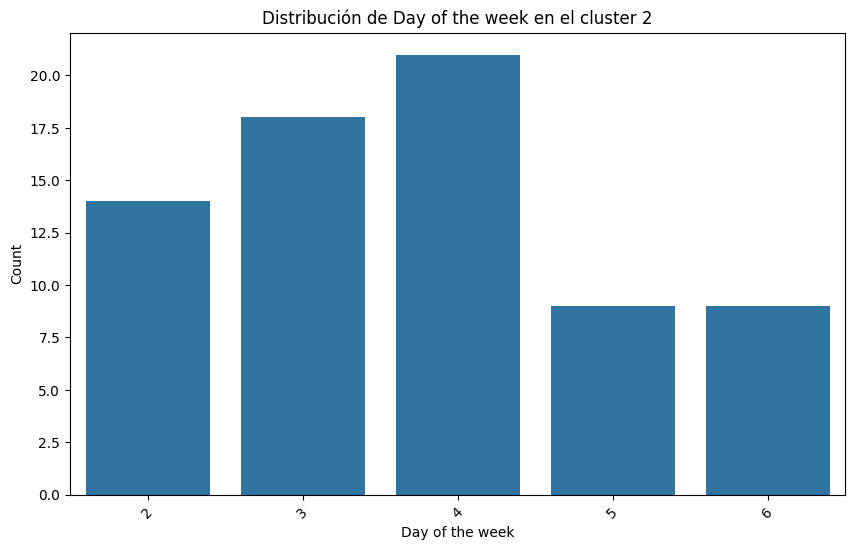

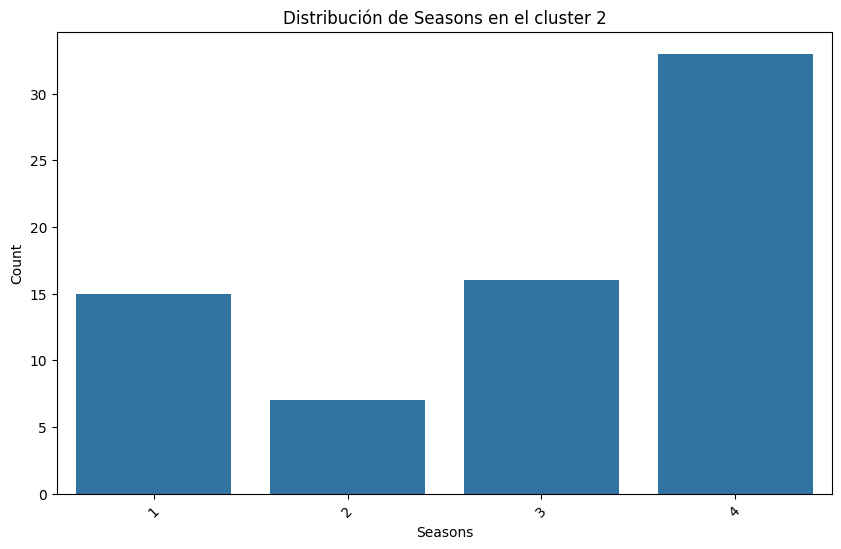

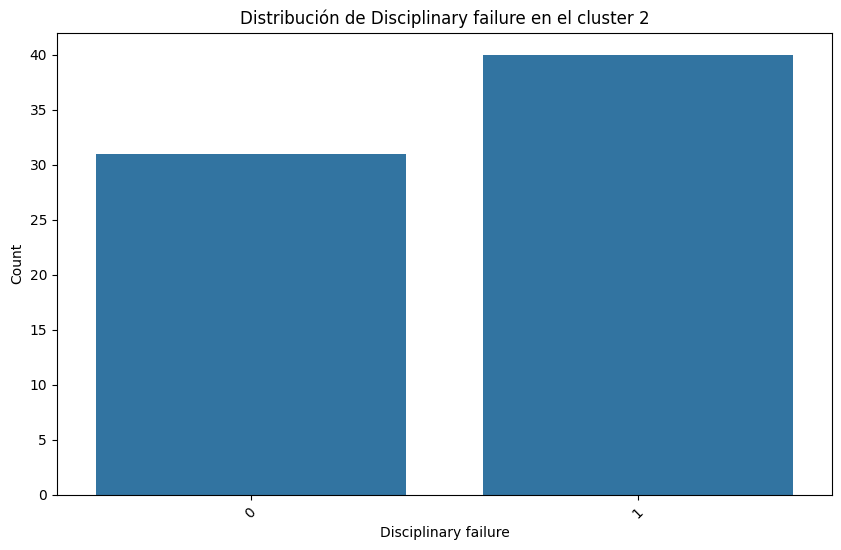

...

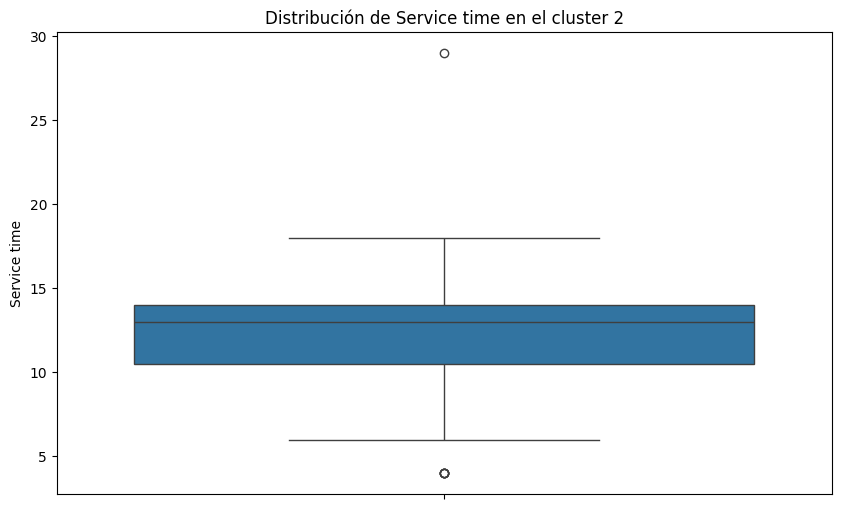

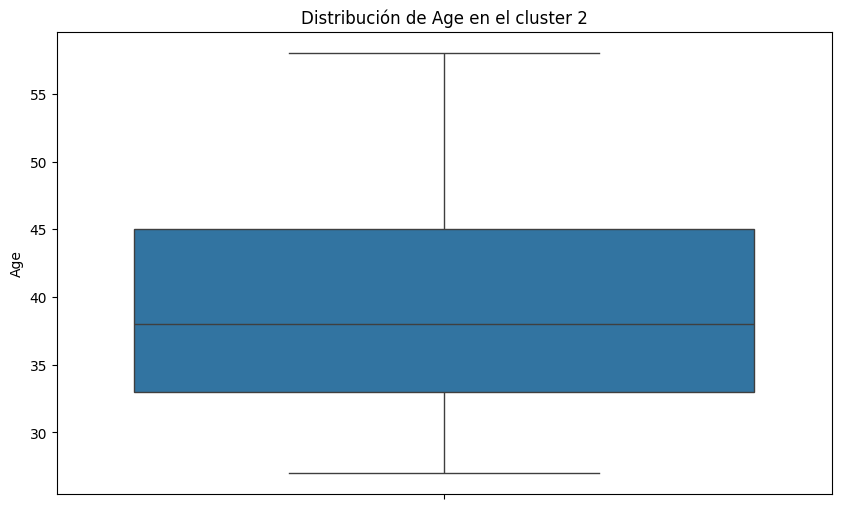

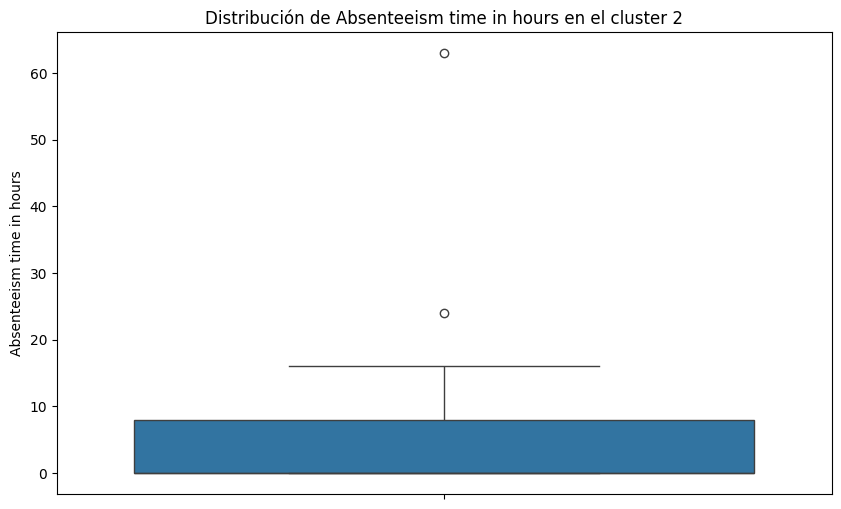

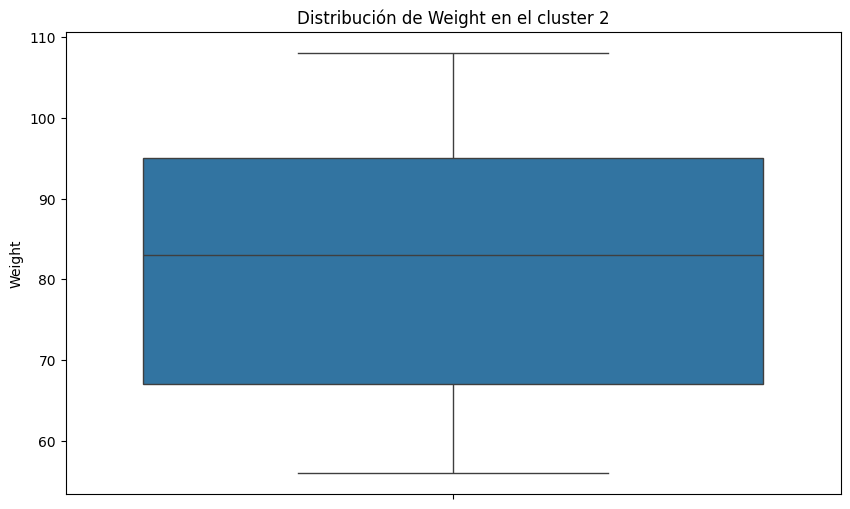

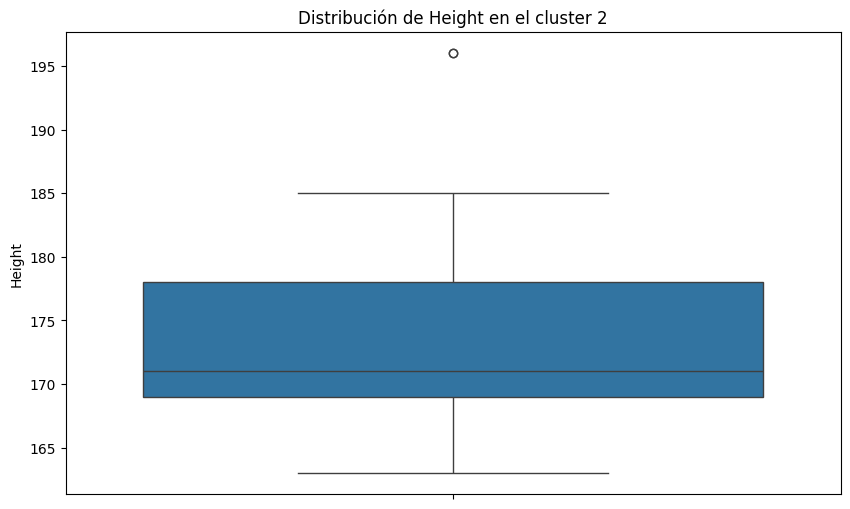

Estadísticas descriptivas para el cluster 2:
       Reason for absence  Month of absence  Day of the week    Seasons  \
count           71.000000         71.000000        71.000000  71.000000   
mean             1.042254          7.394366         3.732394   2.943662   
std              1.847289          3.262247         1.275682   1.193881   
min              0.000000          0.000000         2.000000   1.000000   
25%              0.000000          5.000000         3.000000   2.000000   
50%              0.000000          9.000000         4.000000   3.000000   
75%              1.000000         10.000000         4.500000   4.000000   
max              6.000000         12.000000         6.000000   4.000000   

       Transportation expense  Distance from Residence to Work  Service time  \
count               71.000000                        71.000000     71.000000   
mean               240.901408                        26.169014     12.535211   
std                 77.267098          

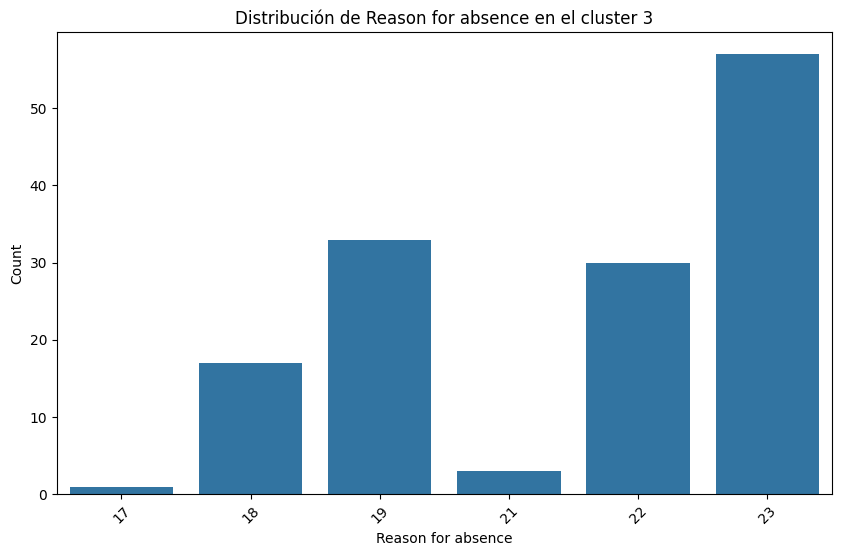

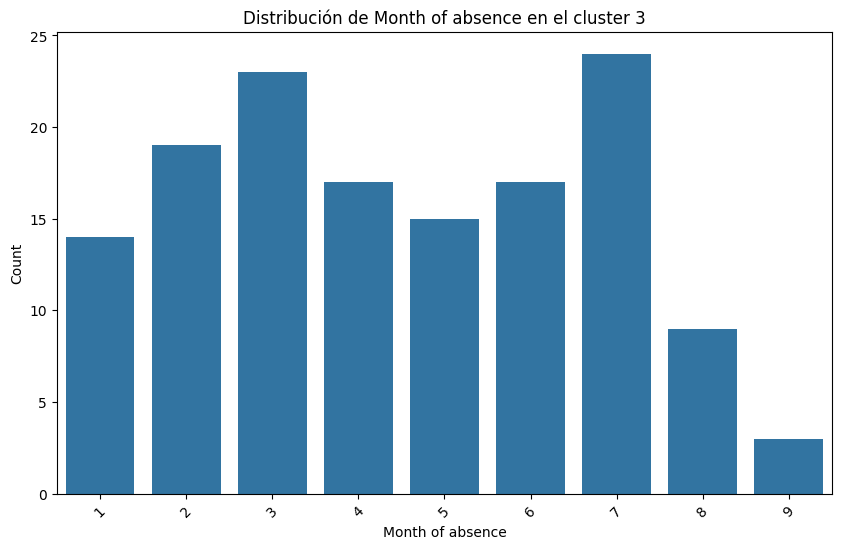

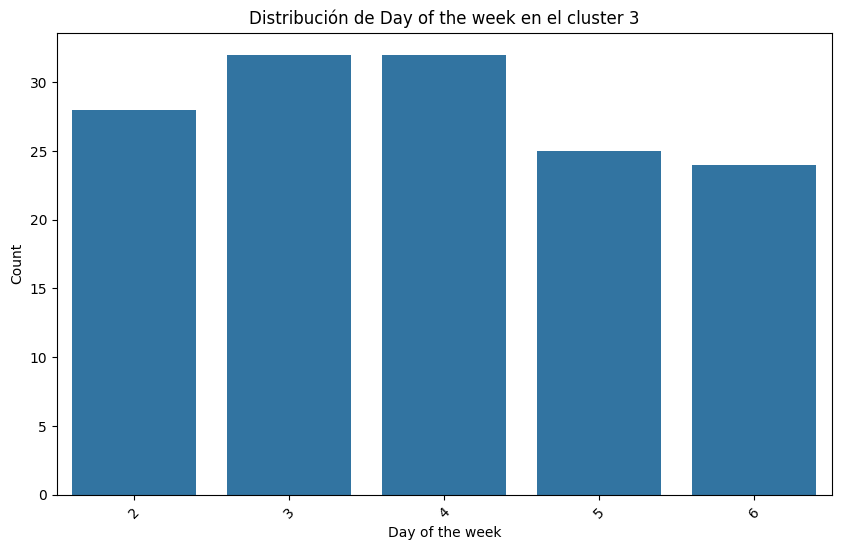

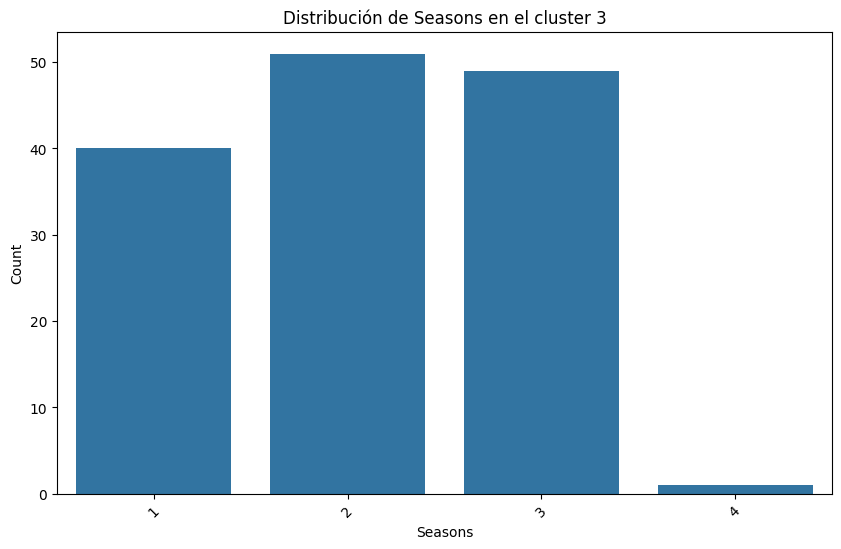

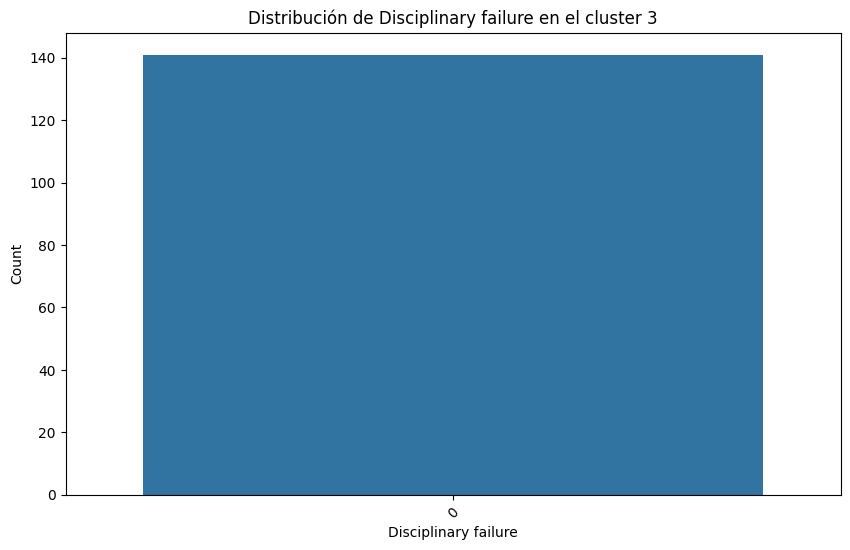

...

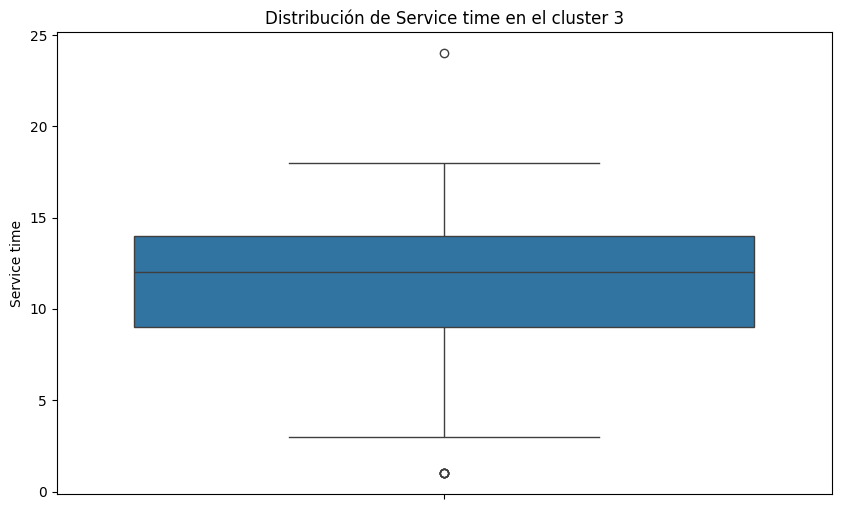

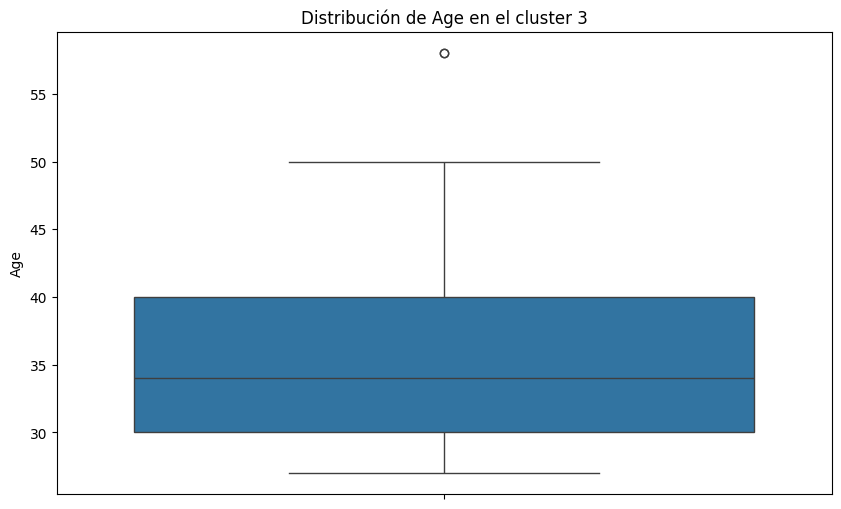

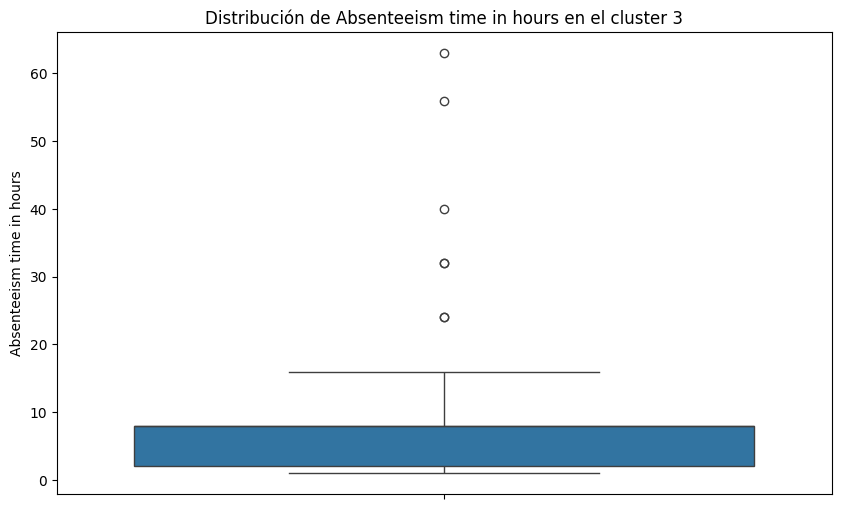

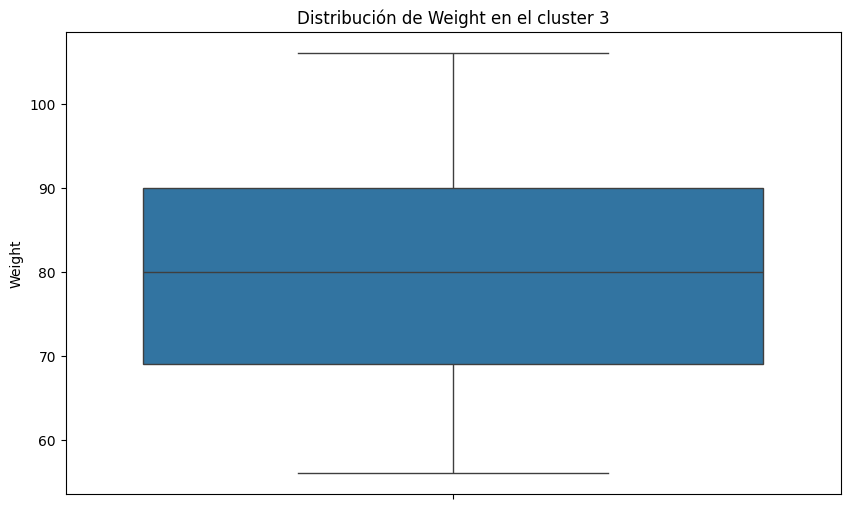

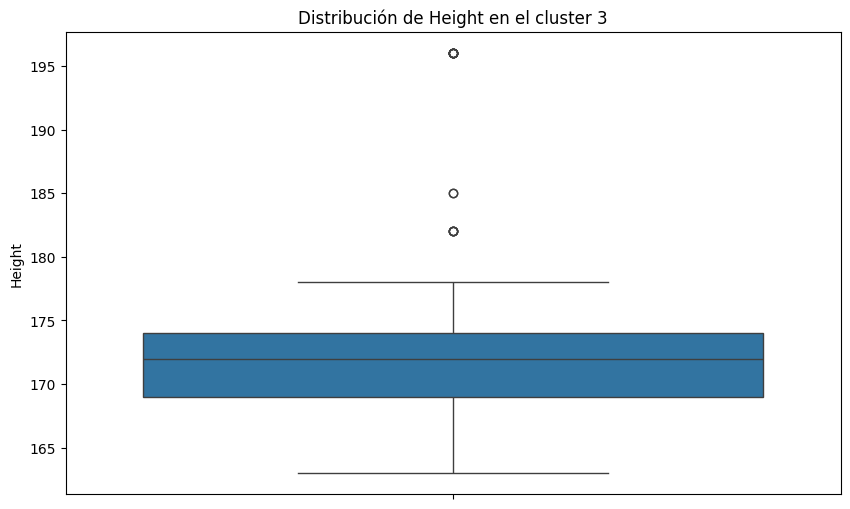

Estadísticas descriptivas para el cluster 3:
       Reason for absence  Month of absence  Day of the week     Seasons  \
count          141.000000        141.000000       141.000000  141.000000   
mean            21.163121          4.489362         3.893617    2.078014   
std              1.991497          2.250768         1.371663    0.811268   
min             17.000000          1.000000         2.000000    1.000000   
25%             19.000000          3.000000         3.000000    1.000000   
50%             22.000000          4.000000         4.000000    2.000000   
75%             23.000000          7.000000         5.000000    3.000000   
max             23.000000          9.000000         6.000000    4.000000   

       Transportation expense  Distance from Residence to Work  Service time  \
count              141.000000                       141.000000    141.000000   
mean               233.070922                        29.127660     11.439716   
std                 72.600634 

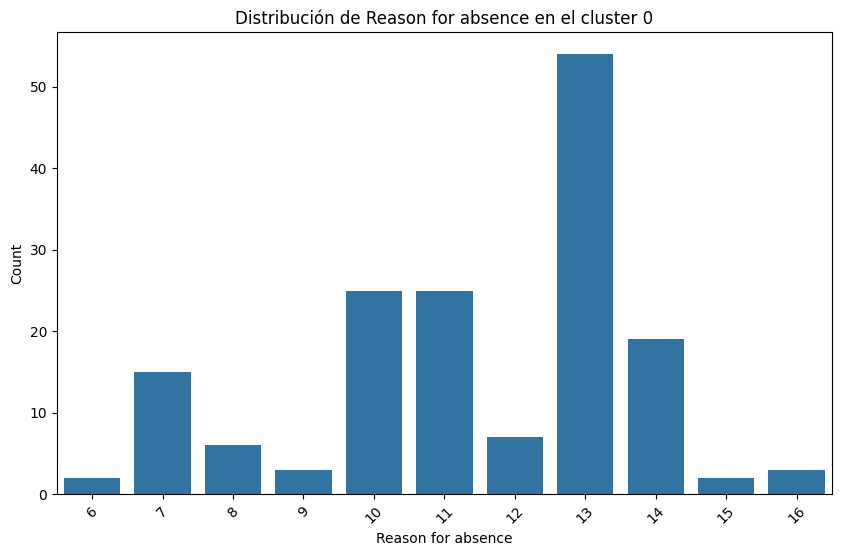

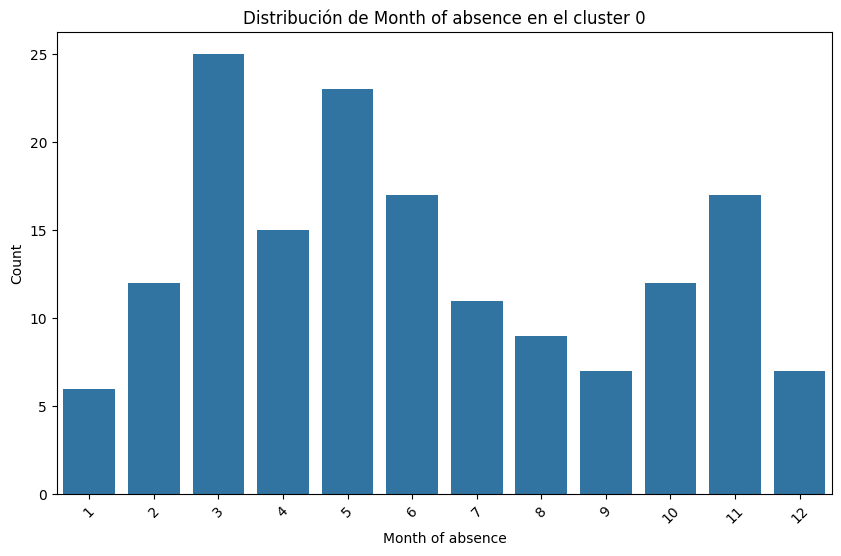

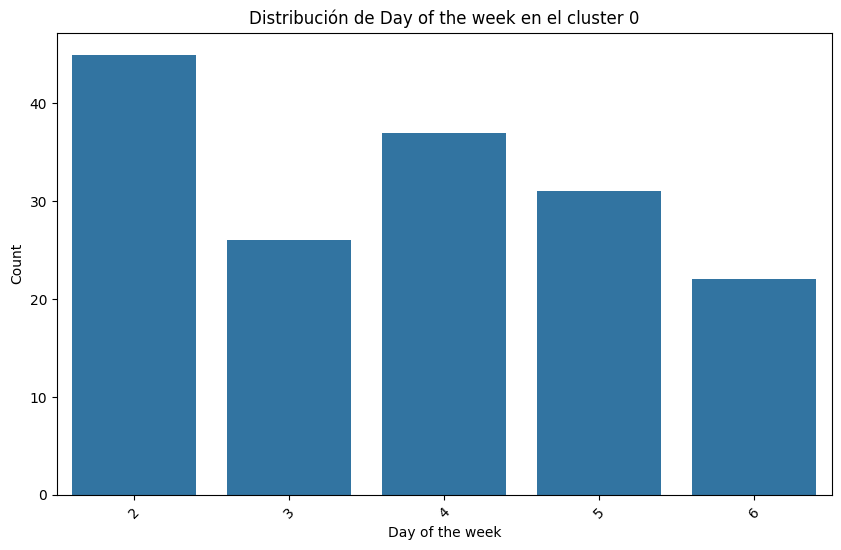

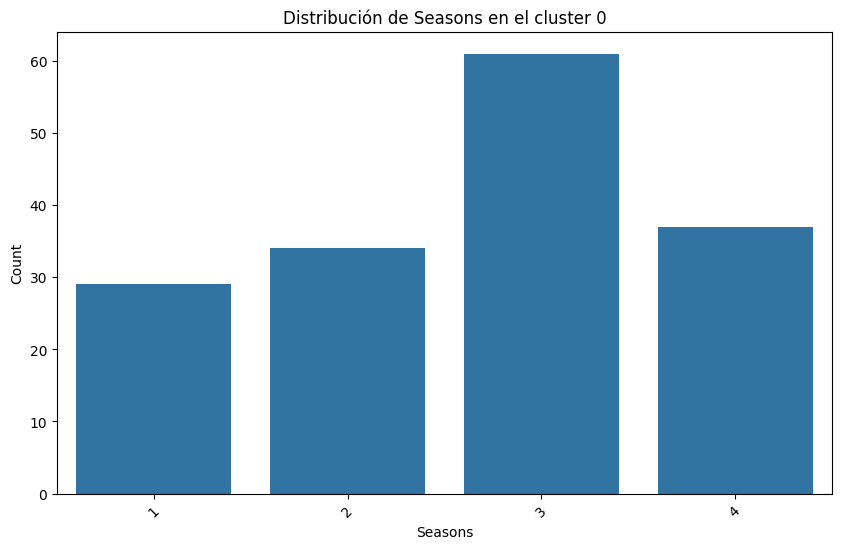

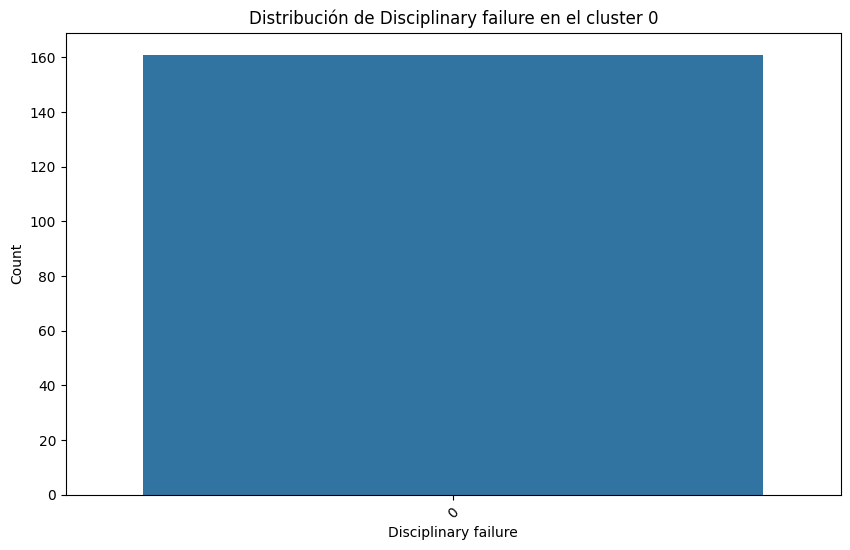

...

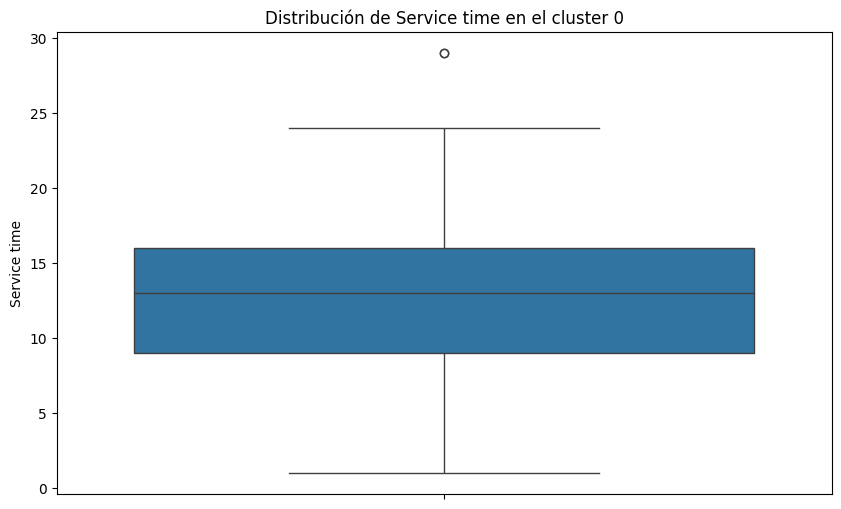

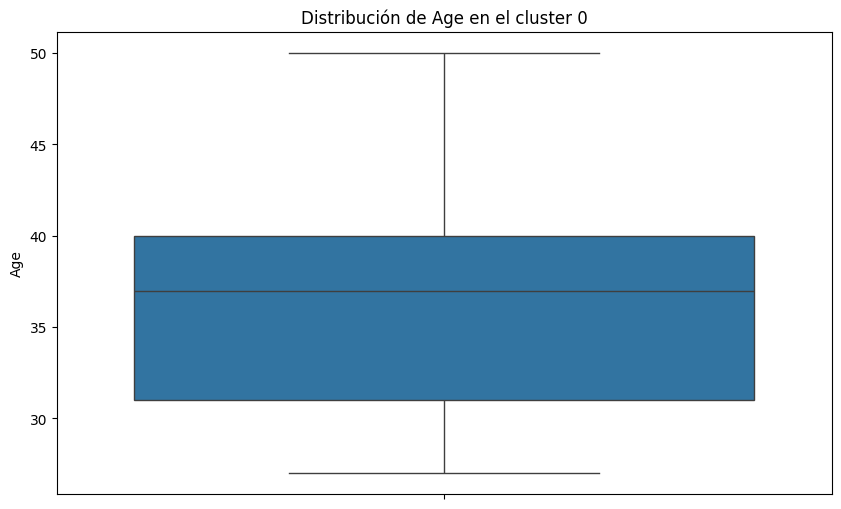

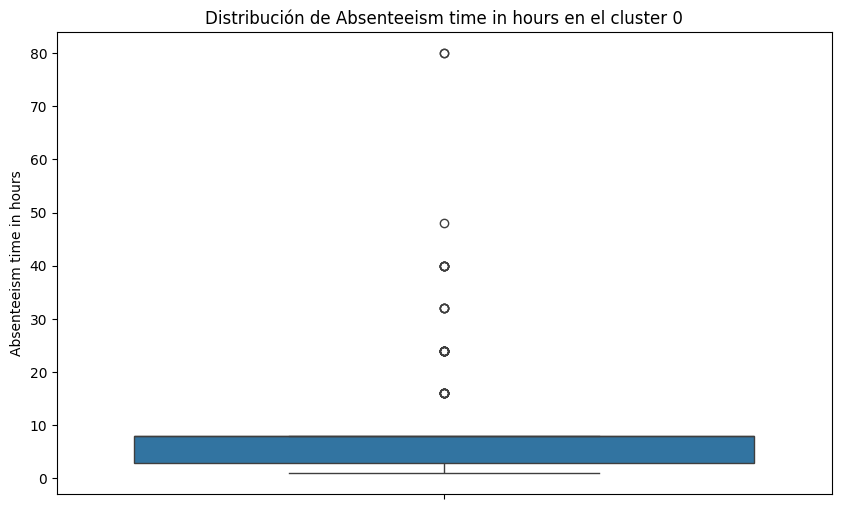

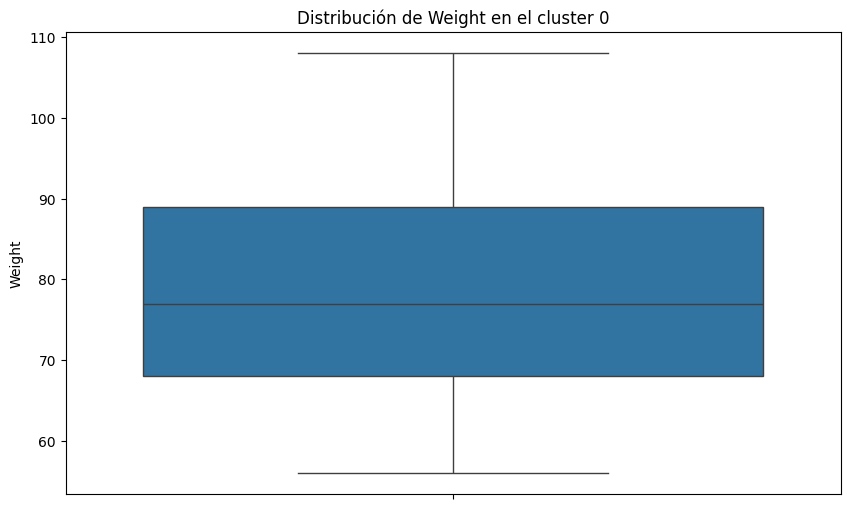

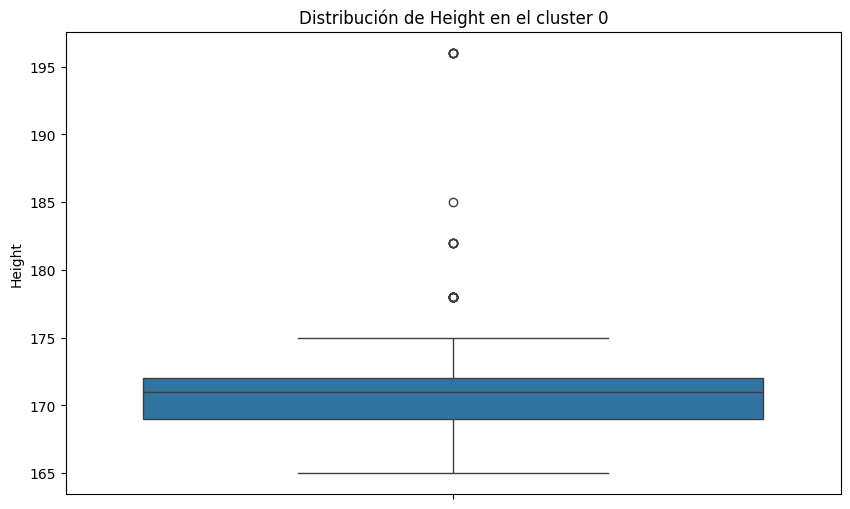

Estadísticas descriptivas para el cluster 0:
       Reason for absence  Month of absence  Day of the week     Seasons  \
count          161.000000        161.000000       161.000000  161.000000   
mean            11.472050          6.118012         3.745342    2.658385   
std              2.299625          3.188610         1.402139    1.025339   
min              6.000000          1.000000         2.000000    1.000000   
25%             10.000000          3.000000         2.000000    2.000000   
50%             12.000000          5.000000         4.000000    3.000000   
75%             13.000000          9.000000         5.000000    3.000000   
max             16.000000         12.000000         6.000000    4.000000   

       Transportation expense  Distance from Residence to Work  Service time  \
count              161.000000                       161.000000    161.000000   
mean               221.770186                        27.366460     12.639752   
std                 68.062586 

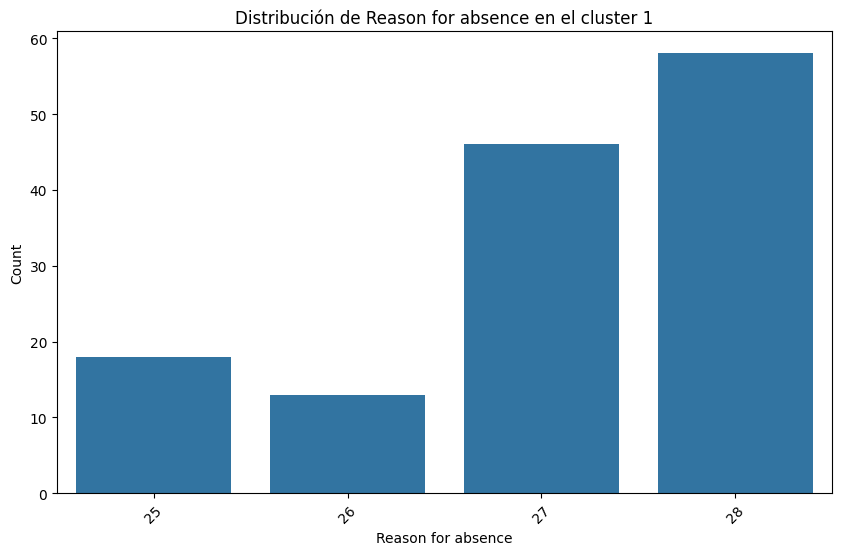

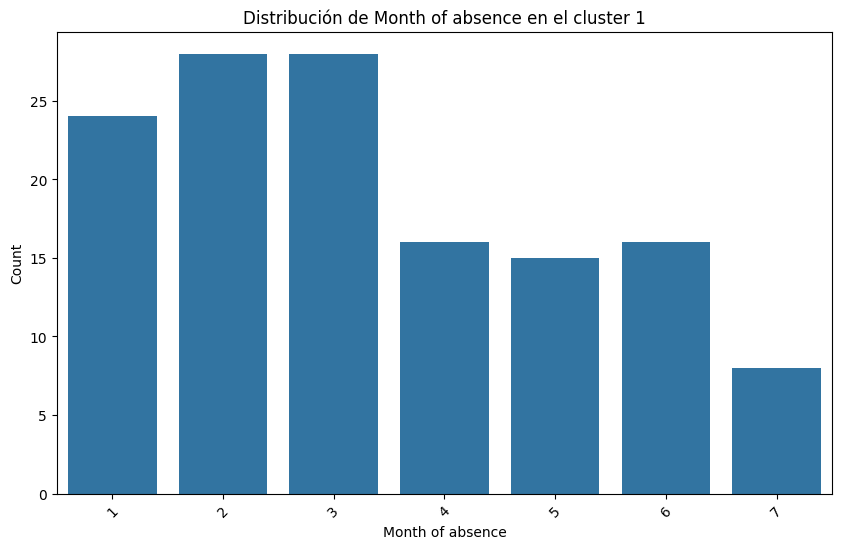

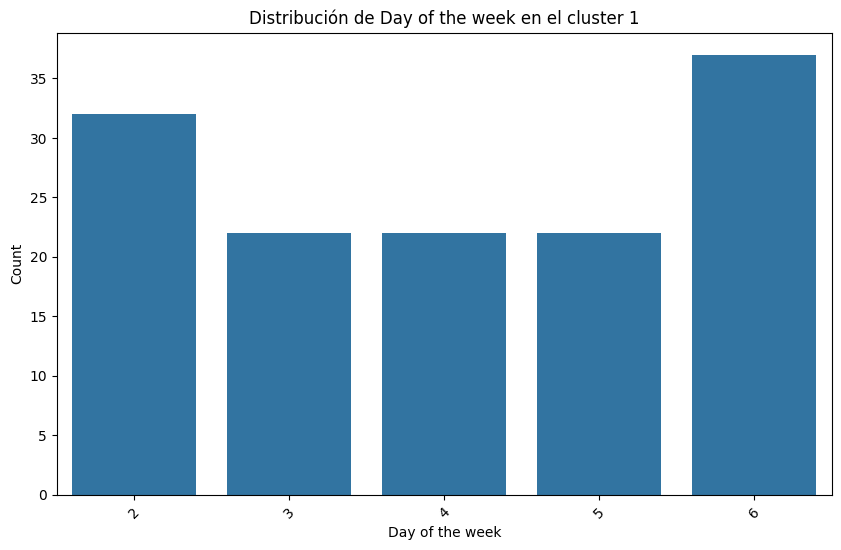

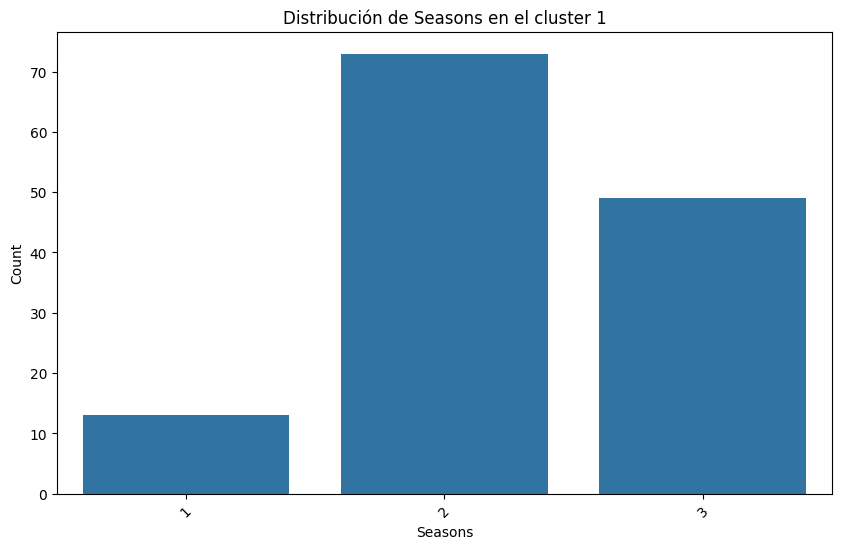

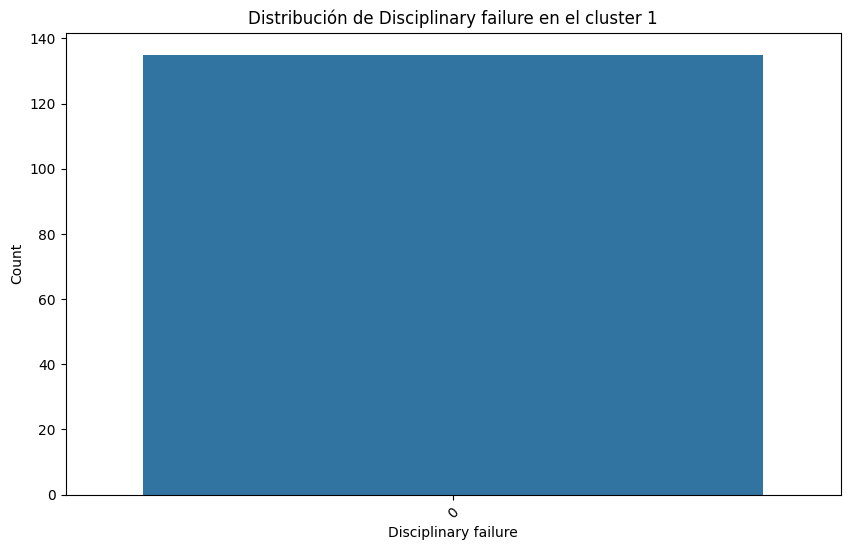

...

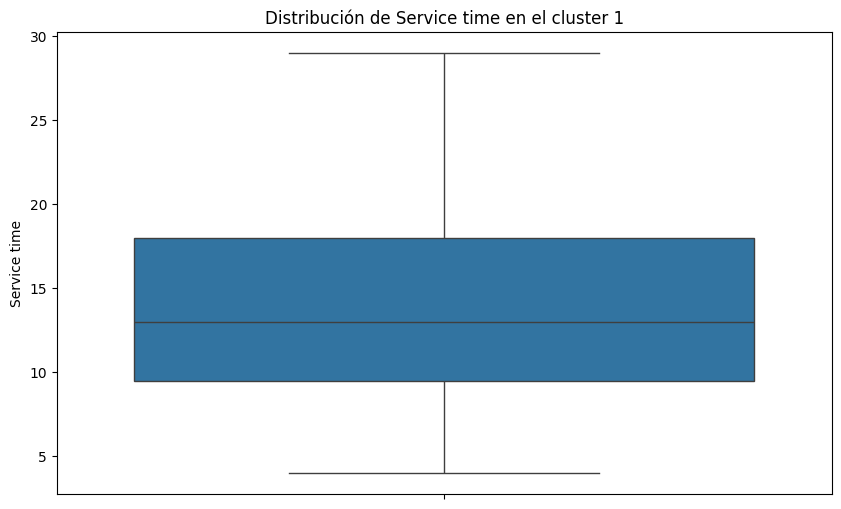

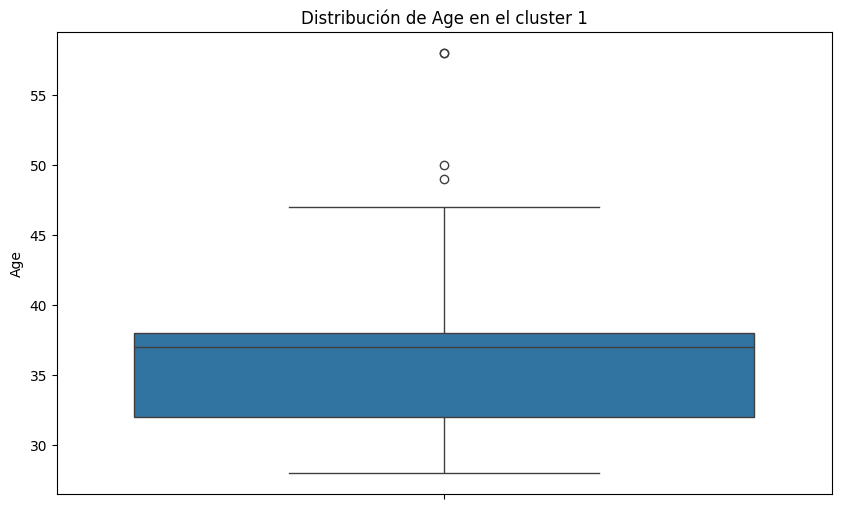

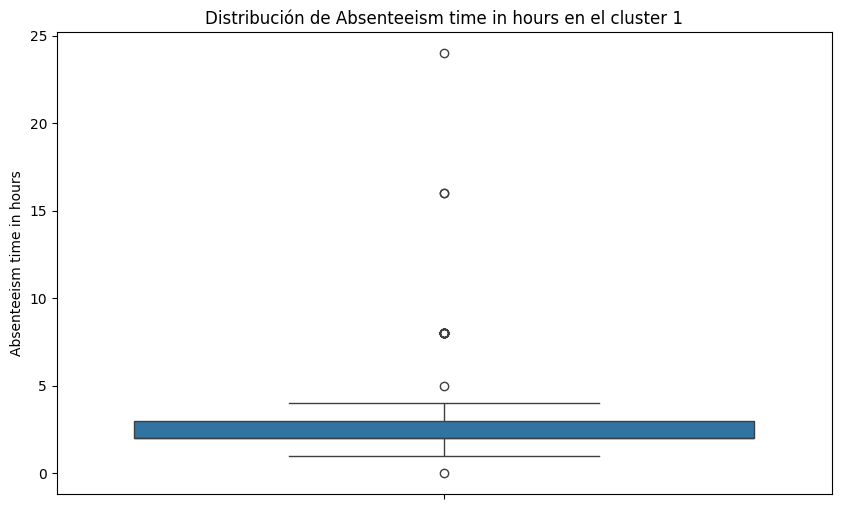

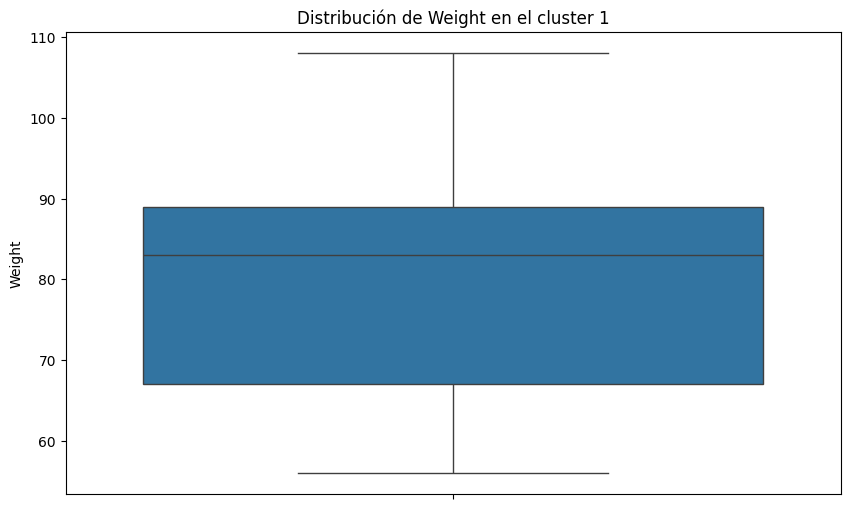

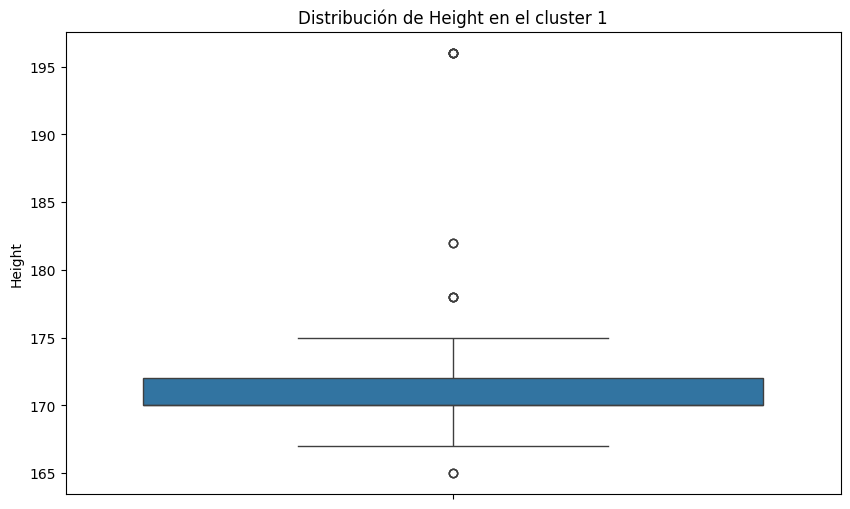

Estadísticas descriptivas para el cluster 1:
       Reason for absence  Month of absence  Day of the week     Seasons  \
count          135.000000        135.000000       135.000000  135.000000   
mean            27.066667          3.370370         4.074074    2.266667   
std              1.030867          1.839617         1.543545    0.625336   
min             25.000000          1.000000         2.000000    1.000000   
25%             27.000000          2.000000         3.000000    2.000000   
50%             27.000000          3.000000         4.000000    2.000000   
75%             28.000000          5.000000         6.000000    3.000000   
max             28.000000          7.000000         6.000000    3.000000   

       Transportation expense  Distance from Residence to Work  Service time  \
count              135.000000                       135.000000    135.000000   
mean               199.748148                        31.859259     13.325926   
std                 50.255573 

In [34]:
# Filtrar el DataFrame por cada cluster
clusters = df_final['Cluster_1'].unique()

for cluster in clusters:
    cluster_data = df_final[df_final['Cluster_1'] == cluster]

    # Paso 1: Análisis de estadísticas descriptivas por cluster
    cluster_stats = cluster_data.describe()

    # Paso 2: Visualización de características por cluster
    categorical_columns = ['Reason for absence', 'Month of absence', 'Day of the week', 'Seasons',
                           'Disciplinary failure', 'Education', 'Social drinker', 'Social smoker']
    numeric_columns = ['Transportation expense', 'Distance from Residence to Work',
                       'Service time', 'Age', 'Absenteeism time in hours', 'Weight', 'Height']

    for col in categorical_columns:
        plt.figure(figsize=(10, 6))
        sns.countplot(data=cluster_data, x=col)
        plt.title(f'Distribución de {col} en el cluster {cluster}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.show()

    for col in numeric_columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=cluster_data, y=col)
        plt.title(f'Distribución de {col} en el cluster {cluster}')
        plt.ylabel(col)
        plt.show()

    # También puedes imprimir las estadísticas descriptivas para tener una idea rápida de las características del cluster
    print(f"Estadísticas descriptivas para el cluster {cluster}:")
    print(cluster_stats)

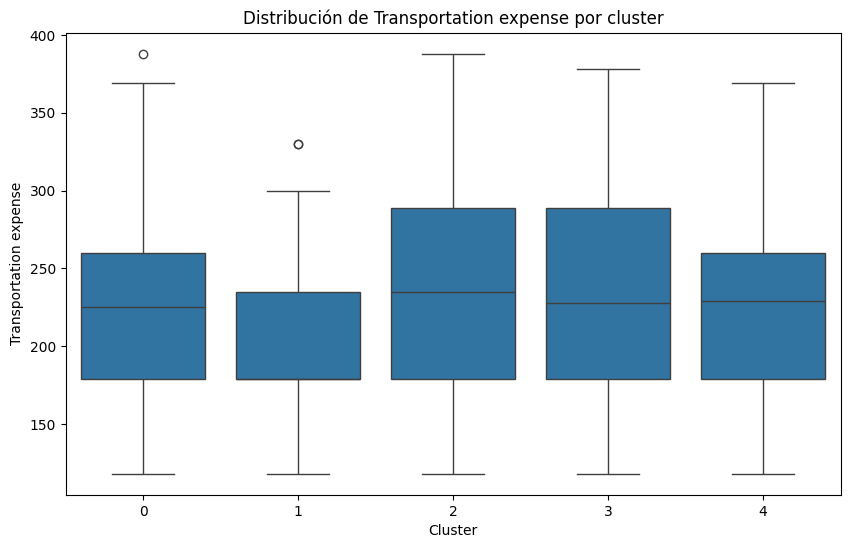

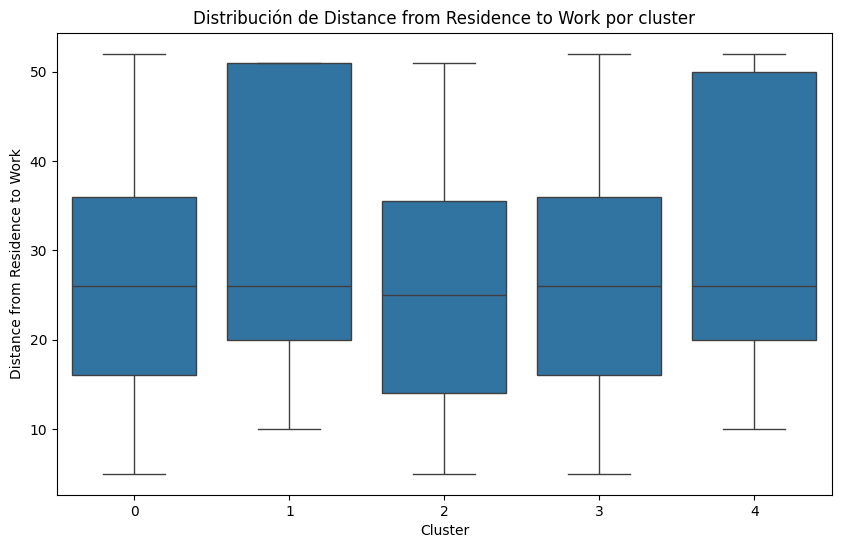

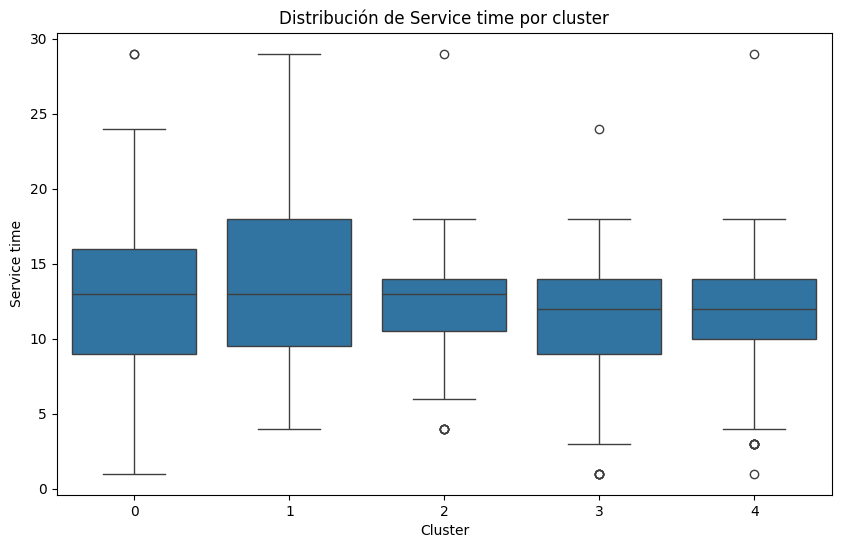

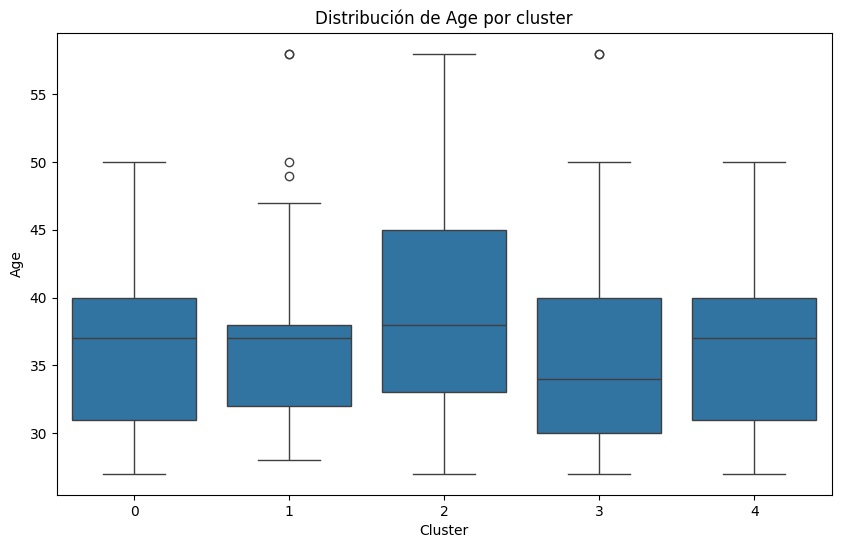

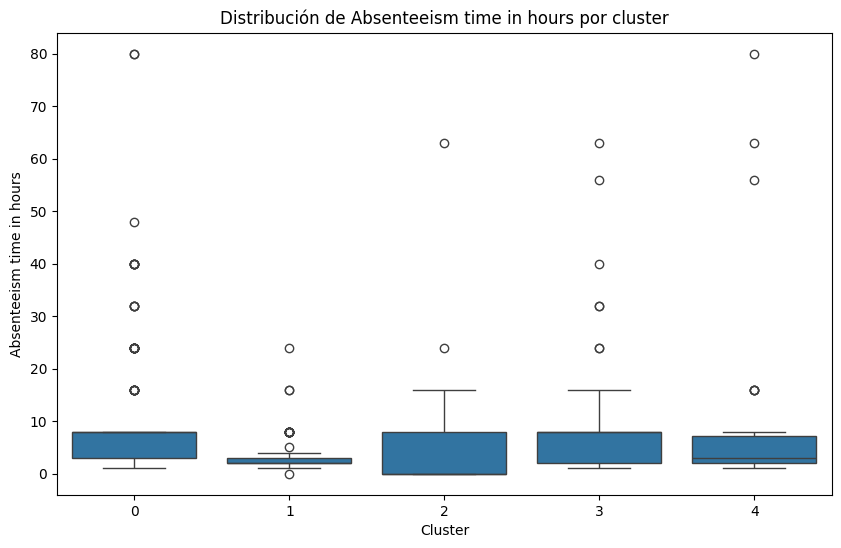

In [35]:
# Lista de variables a visualizar
variables = ['Transportation expense', 'Distance from Residence to Work',
             'Service time', 'Age', 'Absenteeism time in hours']

# Visualización de variables numéricas por cluster
for variable in variables:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df_final, x='Cluster_1', y=variable)
    plt.title(f'Distribución de {variable} por cluster')
    plt.xlabel('Cluster')
    plt.ylabel(variable)
    plt.show()

In [36]:
# Variable numérica a analizar
variable_numerica = 'Absenteeism time in hours'

# Calcular la media de la variable numérica dentro de cada cluster
media_por_cluster = df_final.groupby('Cluster_1')[variable_numerica].mean()

# Calcular la media de la variable numérica en todo el conjunto de datos
media_general = df_final[variable_numerica].mean()

# Calcular la desviación estándar de la variable numérica dentro de cada cluster
std_por_cluster = df_final.groupby('Cluster_1')[variable_numerica].std()

# Calcular la desviación estándar de la variable numérica en todo el conjunto de datos
std_general = df_final[variable_numerica].std()

# Crear un DataFrame para la tabla estadística de la variable numérica
tabla_estadistica_numerica = pd.DataFrame({
    'Media_por_cluster': media_por_cluster,
    'Desviacion_estandar_por_cluster': std_por_cluster,
    'Media_general': media_general,
    'Desviacion_estandar_general': std_general
})

# Mostrar la tabla estadística de la variable numérica
print(tabla_estadistica_numerica)

           Media_por_cluster  Desviacion_estandar_por_cluster  Media_general  \
Cluster_1                                                                      
0                  10.484472                        12.497052       6.217143   
1                   3.348148                         3.055014       6.217143   
2                   3.957746                         8.509552       6.217143   
3                   7.014184                         8.577367       6.217143   
4                   4.906250                         8.438354       6.217143   

           Desviacion_estandar_general  
Cluster_1                               
0                             9.267368  
1                             9.267368  
2                             9.267368  
3                             9.267368  
4                             9.267368  


In [37]:


# Variable a analizar
variable = 'Absenteeism time in hours'

# Calcular la distribución porcentual de 'Reason for absence' dentro de cada cluster
distribucion_por_cluster = df_final.groupby(['Cluster_1', variable])[variable].count() / \
                            df_final.groupby('Cluster_1')[variable].count()

# Calcular la distribución porcentual de 'Reason for absence' en todos los clusters combinados
distribucion_general = df_final[variable].value_counts() / len(df_final)

# Convertir la distribución general en un DataFrame
distribucion_general = distribucion_general.to_frame().transpose()

# Concatenar la distribución por cluster con la distribución general
tabla_estadistica = pd.concat([distribucion_por_cluster.unstack(), distribucion_general], axis=0)

# Agregar una fila para la distribución general
tabla_estadistica.loc['General'] = distribucion_general.squeeze()

# Transponer la tabla estadística
tabla_estadistica_transpuesta = tabla_estadistica.transpose()

# Mostrar la tabla estadística transpuesta
print(tabla_estadistica_transpuesta)




                                  0         1         2         3         4  \
Absenteeism time in hours                                                     
0                               NaN  0.007407  0.605634       NaN       NaN   
1                          0.086957  0.096296  0.028169  0.106383  0.213542   
2                          0.086957  0.429630       NaN  0.191489  0.197917   
3                          0.142857  0.222222  0.014085  0.113475  0.166667   
4                          0.055901  0.111111       NaN  0.049645  0.151042   
5                          0.006211  0.007407  0.014085  0.007092  0.015625   
7                               NaN       NaN       NaN       NaN  0.005208   
8                          0.409938  0.103704  0.295775  0.460993  0.213542   
16                         0.055901  0.014815  0.014085  0.021277  0.020833   
24                         0.074534  0.007407  0.014085  0.014184       NaN   
32                         0.024845       NaN       

# Resumen

## Cluster 0
* La razón de ausencia corresponde a fisioterapia y consulta dental con 34% y 42.9 % respectivamente.
* Mes de ausencia significativa entre los tres primeros meses (enero, febrero y marzo) y registrados los viernes en su mayor proporción.
* En la estación de otoño se registra con un 54%.
* Presentan una edad de 38 años.
* El gasto en transporte en promedio está alrededor de 200 UM (unidades monetarias)
* El ausentismo se caracteriza alrededor de las 2 horas en la mayor parte de los registros.


## Cluster 1
* La razón de ausencia corresponde a enfermedades del sistema osteomuscular y del tejido conjuntivo con un 33.7%
* Las ausencias en mayor proporción entre los meses de marzo y junio. Con día más significativo los lunes.
* La mayoría tienen alrededor de 28 años, pero también presenta gran proporción en 37 y 38 años.
* El gasto en transporte en promedio está alrededor de 222 UM (unidades monetarias)
* El ausentismo se caracteriza alrededor de las 8 horas en la mayor parte de los registros.

## Cluster 2
* La razón de ausencia corresponde a consulta médica representado en un 44.3% y consulta dental de un 26%
* Ausencias concentradas en los últimos 5 meses desde agosto a diciembre. Siendo los martes con la mayor proporción.
* Se presenta en la estación de primavera con un 60%
* La mayor cantidad tienen una edad de 28 años, pero su promedio oscila entre los 36 y 40 años.
* El gasto en transporte en promedio es alrededor de 227 UM (unidades monetarias).
* El ausentismo se caracteriza de 1 a 8 horas, con un promedio de 4.9 horas.

## Cluster 3
* No presenta razón de ausencia en 59.7 %, seguido de enfermedades infecciosas y parasitarias con un 22.2 %
* Ausencias registradas en el mes de octubre, con el miércoles de día de mayor proporción.
* Estan en esta agrupación se concentran los que tienen fallos disciplinarios
* El rango de edad oscila entre los 36 y 50 años.
* El gasto en transporte en promedio es alrededor de 241 UM (unidades monetarias).
* No registran horas de ausentismo.


## Cluster 4
* La razón de ausencia corresponde a consulta médica y lesiones, envenenamientos y algunas otras consecuencias de causas externas con un 40% y 23% respectivamente.
* Las ausencias en mayor proporción entre los meses de marzo y julio. Distribuidos todos los días de la semana.
* Presentan una edad de 28 años.
* El gasto en transporte en promedio es alrededor de 233 UM (unidades monetarias).
* El ausentismo se caracteriza de 2 a 8 horas, con un promedio de 7 horas.
